# Machine Learning for Music Understanding: Similarity Detection and Genre Classification Using  Autoencoders

**Students:**

- Camilo Andres Cuello Romero ccuello@unal.edu.co
- Juan Andres Orozco Velandia jorozcove@unal.edu.co
- Omar David Toledo Leguizamon otoledo@unal.edu.co

## Imports and routes definition

Import all the needed libraries

In [ ]:
import os
import pandas as pd
from google.colab import drive
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import librosa
import librosa.display
import IPython.display as ipd
import tensorflow as tf
from collections import Counter
import tensorflow.keras as keras
from tensorflow.keras import ops
from tensorflow.keras import layers
from tensorflow.keras.utils import Sequence, register_keras_serializable
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, LabelBinarizer
from sklearn.metrics import confusion_matrix, classification_report, auc, roc_curve
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB
import soundfile as sf
import tifffile
import joblib
from skimage.io import imread, imshow
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

Define the global routes that are going to be taken into account (This project is supported to save files in google drive storage)

In [ ]:
drive.mount('/content/drive')
proj_dir = '/content/drive/Shareddrives/ML-Proj'

Mounted at /content/drive


## Gather Data

Import dataset from kaggle, and create song paths dataframe with its related genres

In [ ]:
import kagglehub
dataset_ref = 'andradaolteanu/gtzan-dataset-music-genre-classification'
route = kagglehub.dataset_download(dataset_ref)
route

'/kaggle/input/gtzan-dataset-music-genre-classification'

In [ ]:
dataset_path = os.path.join(route, 'Data')
genres_path = os.path.join(dataset_path, 'genres_original')
genres = os.listdir(genres_path)
if os.path.exists(os.path.join(proj_dir, 'songs_base_df.csv')):
  songs_df = pd.read_csv(os.path.join(proj_dir, 'songs_base_df.csv'))
else:
  songs = {
      'path' : [],
      'genre': [],
  }
  for genre in genres:
      for song in os.listdir(f'{genres_path}/{genre}'):
          songs['path'].append(f'{genres_path}/{genre}/{song}')
          songs['genre'].append(genre)

  songs_df = pd.DataFrame(songs).sort_values(by='path', ascending=True)
if not os.path.exists(os.path.join(proj_dir, 'songs_base_df.csv')):
  songs_df.to_csv(os.path.join(proj_dir, 'songs_base_df.csv'), index=False)
songs_df['genre'].unique()

array(['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz',
       'metal', 'pop', 'reggae', 'rock'], dtype=object)

In [ ]:
songs_df.head()

,path,genre
0,/kaggle/input/gtzan-dataset-music-genre-classi...,blues
1,/kaggle/input/gtzan-dataset-music-genre-classi...,blues
2,/kaggle/input/gtzan-dataset-music-genre-classi...,blues
3,/kaggle/input/gtzan-dataset-music-genre-classi...,blues
4,/kaggle/input/gtzan-dataset-music-genre-classi...,blues


## Exploratory Analysis

Listen a example song

In [ ]:
example_song = songs_df.sample(1)
example_song_path = example_song['path'].values[0]
example_song_genre = example_song['genre'].values[0]
print(f'Song genre: {example_song_genre}')
print(f'Song path: {example_song_path}')
ipd.Audio(filename=example_song_path)

Song genre: hiphop
Song path: /kaggle/input/gtzan-dataset-music-genre-classification/Data/genres_original/hiphop/hiphop.00070.wav


Check that songs are valid

In [ ]:
def is_valid_audio(path, min_size_bytes=1000):
    if not os.path.exists(path):
        return False
    if os.path.getsize(path) < min_size_bytes:
        return False
    try:
        _ = sf.SoundFile(path)
        return True
    except:
        pass
    try:
        with audioread.audio_open(path) as f:
            return True
    except:
        pass
    return False

In [ ]:
if os.path.exists(os.path.join(proj_dir, 'songs_valid_df.csv')):
  songs_df = pd.read_csv(os.path.join(proj_dir, 'songs_valid_df.csv'))
else:
  songs_df['is_valid'] = songs_df['path'].apply(is_valid_audio)
  print(songs_df[~songs_df['is_valid']])
  songs_df = songs_df[songs_df['is_valid']].drop(
      columns='is_valid'
  ).reset_index(drop=True)
  songs_df.to_csv(os.path.join(proj_dir, 'songs_valid_df.csv'), index=False)

In [ ]:
initial_df = pd.read_csv(os.path.join(proj_dir, 'songs_base_df.csv'))
final_df = pd.read_csv(os.path.join(proj_dir, 'songs_valid_df.csv'))

print(f'Total of ill-defined songs: {len(initial_df)-len(final_df)}')

Total of ill-defined songs: 1


Now with the filtered valid audios, we can check the classes balance and if it is necessary to make an undersampling or oversampling process.

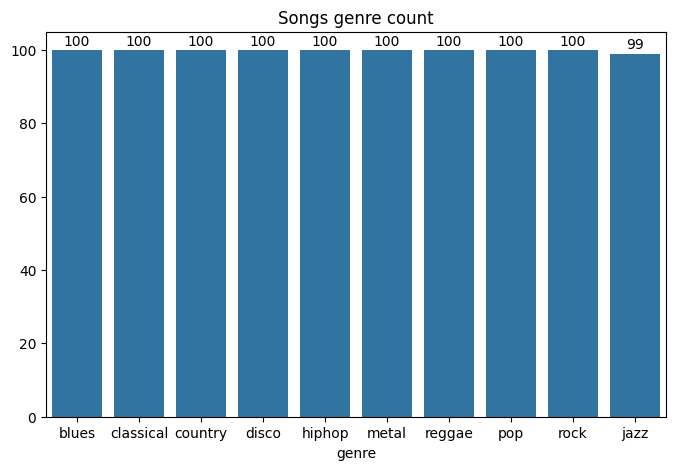

In [ ]:
counts = songs_df['genre'].value_counts()
plt.figure(figsize=(8,5))
sns.barplot(x=counts.index, y=counts.values)
for i, value in enumerate(counts.values):
    plt.text(i, value + 0.5, f'{value}', ha='center', va='bottom', fontsize=10)
plt.title('Songs genre count')
plt.show()

As we can see, data is already balanced with 99-100 samples per class

## Data transformation

Apply short term fourier transform (stft) to the song, this way we get two components, the magnitude and the phase which are going to be our core representation

In [ ]:
def apply_stft(song_path, n_fft=1022, hop_length=862, sample_rate=14700, verbose=False):
    audio, sr = librosa.load(song_path, sr=sample_rate, mono=True)
    if verbose:
        print(f"Original audio: {len(audio)} samples, sample rate: {sr} Hz")
    assert sr == sample_rate, "Sample rate mismatch"
    stft = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length, window='hann')
    return stft, audio, sr

def apply_istft(stft, n_fft=1022, hop_length=862, length=None):
    reconstructed_audio = librosa.istft(stft, n_fft=n_fft, hop_length=hop_length, length=length)
    return reconstructed_audio

def get_magnitude_phase(stft):
    magnitude = np.abs(stft)
    phase = np.angle(stft)
    return magnitude, phase

Any songs share the same magnitude/phase shape

In [ ]:
h_l = 862
n_fft = 1022
sr = 14700
stft, audio, sr = apply_stft(example_song_path, hop_length=h_l, n_fft=n_fft, sample_rate=sr, verbose=True)
magnitude, phase = get_magnitude_phase(stft)

print(f'Magnitude shape: {magnitude.shape}')
print(f'Phase shape: {phase.shape}')

assert magnitude.shape == phase.shape, \
       'Phase and magnitude do not have the same shape'

Original audio: 441196 samples, sample rate: 14700 Hz
Magnitude shape: (512, 512)
Phase shape: (512, 512)


And this is a reversible process

In [ ]:
ipd.Audio(example_song_path)

In [ ]:
new_stft = magnitude * np.exp(1j * phase)
reconstructed_audio = apply_istft(new_stft, hop_length=h_l, n_fft=n_fft, length=len(audio))
ipd.Audio(reconstructed_audio, rate=sr)

Then we can use magnitude and phase to create images, in this case we are going to put each component in a RGB channel so we got a full representation of an audio file as an image

R: magnitude
G: phase
B: (unused)

In [ ]:
def audio_to_img_2ch(song_path, base_img_path='.', filename="img_2ch"):
    stft,y, sr = apply_stft(song_path)
    magnitude, phase = get_magnitude_phase(stft)
    img_2ch = np.stack((magnitude, phase), axis=-1).astype(np.float32)
    #MinMax scale
    min = img_2ch.min()
    max = img_2ch.max()
    img_2ch = (img_2ch - min) / (max - min + 1e-8)
    img_path = os.path.join(base_img_path, f'{filename}.tiff')
    tifffile.imwrite(img_path, img_2ch)
    return img_path, len(y), sr, min, max

def img_2ch_to_audio(img_path, length, min, max, n_fft=1022, hop_length=862, sample_rate=14700, filename="reconstructed_audio"):
    img_2ch = tifffile.imread(img_path).astype(np.float32)
    img_2ch = img_2ch * (max - min) + min
    magnitude = img_2ch[..., 0]
    phase = img_2ch[..., 1]
    reconstructed_stft = magnitude * np.exp(1j * phase)
    reconstructed_audio = apply_istft(reconstructed_stft, hop_length=hop_length, n_fft=n_fft, length=length)
    sf.write(f'{filename}.wav', reconstructed_audio, sample_rate)

def show_img_2ch(img_path, figsize=(12, 6), split_channels=False):
  img_2ch = tifffile.imread(img_path).astype(np.float32)
  magnitude = img_2ch[..., 0]
  phase = img_2ch[..., 1]
  zeros = np.zeros_like(magnitude)
  img_rgb = np.stack((magnitude, phase, zeros), axis=-1)

  if not split_channels:
    plt.figure(figsize=figsize)
    imshow(img_rgb)
    plt.title("Magnitude (R), Phase (G)")
    plt.axis('off')
    plt.show()

  else:
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    axes[0].imshow(magnitude, cmap='gray')
    axes[0].set_title("Magnitude")
    axes[1].imshow(phase, cmap='gray')
    axes[1].set_title("Phase")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

Image path: ./example_2ch.tiff


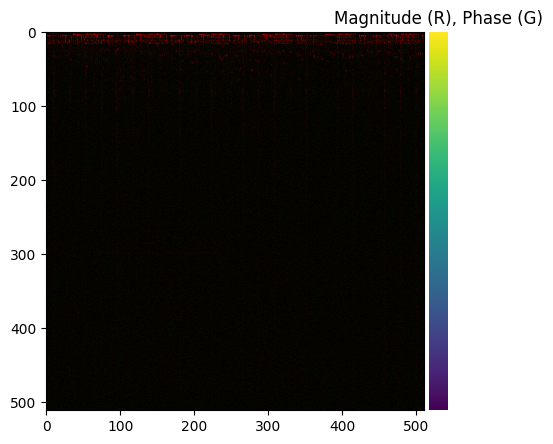

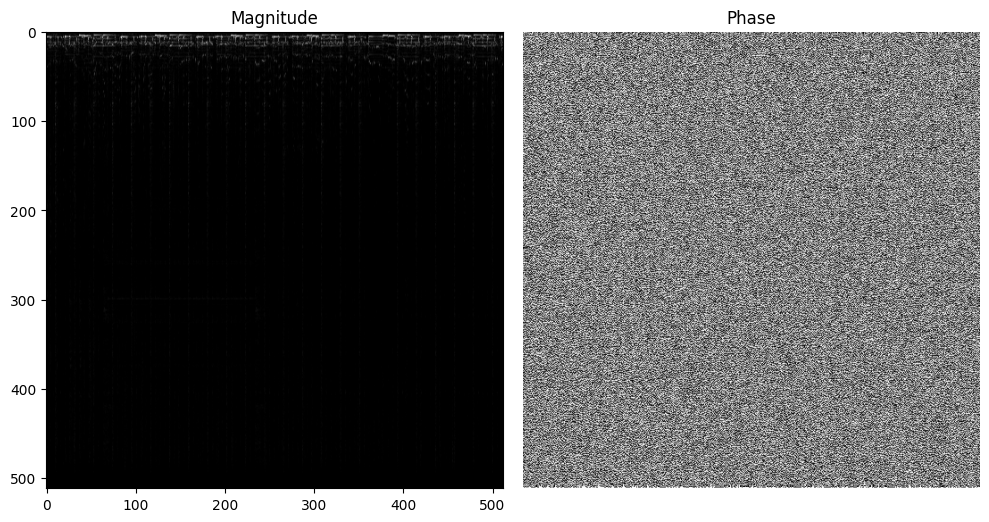

In [ ]:
img_path, length, sr, min_, max_ = audio_to_img_2ch(example_song_path, filename="example_2ch")
print(f"Image path: {img_path}")
show_img_2ch(img_path, figsize=(5,5))
show_img_2ch(img_path, figsize=(10,5), split_channels=True)

In [ ]:
audio_filename = 'reconstructed_audio'
img_2ch_to_audio(img_path, length, min_, max_, filename="reconstructed_audio")
ipd.Audio(f'{audio_filename}.wav')

The idea will be to apply this image encoding to all the 999 audios available in order to make the further machine learning tasks

In [ ]:
base_img_path = os.path.join(proj_dir, 'songs_imgs')
os.makedirs(base_img_path, exist_ok = True)
songs_df = pd.read_csv(os.path.join(proj_dir, 'songs_valid_df.csv'))
if os.path.exists(os.path.join(proj_dir, 'songs_images_df.csv')):
  images_df = pd.read_csv(os.path.join(proj_dir, 'songs_images_df.csv'))
else:
  images = {
      'path' : [],
      'genre' : songs_df['genre'],
      'min': [],
      'max': []
  }

  for audio_path in songs_df['path']:
      new_file_name = audio_path.split('/')[-1][:-4]
      if not os.path.exists(os.path.join(base_img_path,f'{new_file_name}.tiff')):
          img_route = audio_to_img_2ch(audio_path,
                                       base_img_path=base_img_path,
                                       filename=new_file_name)
          images['path'].append(img_route[0])
          images['min'].append(img_route[3])
          images['max'].append(img_route[4])
      else:
          img_route = [os.path.join(base_img_path,f'{new_file_name}.tiff')]

  images_df = pd.DataFrame(images).sort_values(by='path', ascending=True)
  images_df.to_csv(os.path.join(proj_dir, 'songs_images_df.csv'), index=False)
length = 441196
sr = 14700

Now we will pick a random sample of the images saved in order to see if the process was done correctly, we will check if the image can be reconstructed into the audio

Song genre: country


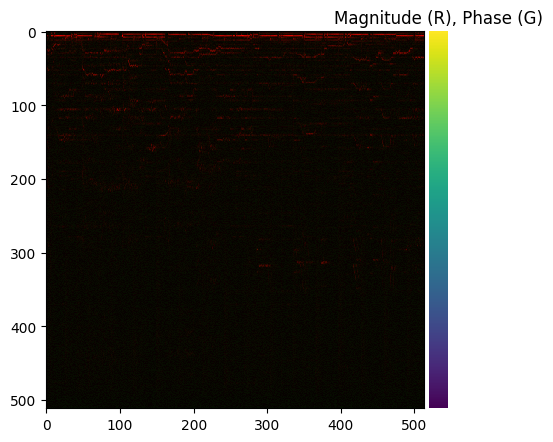

In [ ]:
sample = images_df.sample(1)
sample_path = sample['path'].values[0]
sample_genre = sample['genre'].values[0]
min_ = sample['min'].values[0]
max_ = sample['max'].values[0]
print(f'Song genre: {sample_genre}')
show_img_2ch(sample_path, figsize=(5,5))
img_2ch_to_audio(sample_path, length, min_, max_, filename='reconstructed_audio')
ipd.Audio('reconstructed_audio.wav')

## Data Encoding (Embedding)

We will encode our 999 images of shape (512, 512, 2) into a latent space of size 1024, the idea is to use a variational autoencoder with the following architecture:

Here is the implementation:

In [ ]:
@register_keras_serializable()
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.seed_generator = keras.random.SeedGenerator(1337)

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = ops.shape(z_mean)[0]
        dim = ops.shape(z_mean)[1]
        epsilon = keras.random.normal(shape=(batch, dim), seed=self.seed_generator)
        return z_mean + ops.exp(0.5 * z_log_var) * epsilon

In [ ]:
def adapt_input_to_rgb():
    inputs = keras.Input(shape=(512, 512, 2))
    x = layers.Conv2D(3, kernel_size=1, activation=None)(inputs)
    x = layers.Resizing(224, 224)(x)
    return keras.Model(inputs, x, name="rgb_adapter")

base_model = keras.applications.ResNet50(
        include_top=False,
        weights="imagenet",
        input_shape=(224, 224, 3)
    )

base_model.trainable = False

def vae_encoder_resnet(latent_dim=512):
    input_img = keras.Input(shape=(512, 512, 2))
    x = adapt_input_to_rgb()(input_img)

    x = base_model(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(1024, activation="relu")(x)
    z_mean = layers.Dense(latent_dim, name="z_mean")(x)
    z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
    z = Sampling()([z_mean, z_log_var])
    return keras.Model(input_img, [z_mean, z_log_var, z], name="vae_encoder_resnet")

def decoder(latent_dim=512, output_shape=(512, 512, 2)):
    latent_inputs = keras.Input(shape=(latent_dim,))
    x = layers.Dense(16 * 16 * 128, activation='leaky_relu')(latent_inputs)
    x = layers.Reshape((16, 16, 128))(x)
    for filters in [128, 64, 32, 16, 8]:
        x = layers.Conv2DTranspose(filters, 3, strides=2, padding='same', activation='leaky_relu')(x)
        x = layers.Conv2D(filters, 3, padding='same', activation='leaky_relu')(x)

    decoder_outputs = layers.Conv2D(output_shape[2], 3, padding='same', activation='sigmoid')(x)
    return keras.Model(latent_inputs, decoder_outputs, name="vae_decoder")

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
@register_keras_serializable()
class VAE(keras.Model):
    def __init__(self, latent_dim=512, beta=10.0, alpha=1.0, **kwargs):
        super().__init__(**kwargs)
        self.encoder = vae_encoder_resnet(latent_dim)
        self.decoder = decoder(latent_dim)
        self.latent_dim = latent_dim
        self.alpha = alpha
        self.beta = beta

        self.total_loss_tracker = keras.metrics.Mean(name="loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(name="reconstruction_loss")
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

        print(f'VAE Loss = {alpha} * reconstruction_loss + {beta} * kl_loss')

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        if isinstance(data, (tuple, list)):
            data = data[0]

        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)

            #Normalized MSE (Per pixel)
            num_pixels = tf.cast(tf.reduce_prod(tf.shape(data)[1:]), tf.float32)

            #Compute mean squared error per pixel
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(tf.math.squared_difference(data, reconstruction), axis=(1, 2, 3))
            )


            #Compute KLL
            kl_loss = -0.5 * tf.reduce_mean(
                tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1)
            )

            #Compute total loss
            total_loss = self.alpha * reconstruction_loss + self.beta * kl_loss

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result()
        }

    def call(self, inputs):
        _, _, z = self.encoder(inputs)
        reconstruction = self.decoder(z)
        return reconstruction

Now we will train our variational autoencoder in order to get a model that is able to make our expected embedding.

In [ ]:
import gc
gc.collect()

15

In [ ]:
vae = VAE(latent_dim=512)
vae.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001))

VAE Loss = 1.0 * reconstruction_loss + 1.0 * kl_loss


In [ ]:
vae.summary(expand_nested=False)

Model: "vae_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vae_encoder (Functional)        │ ((None, 1024), (None,  │     1,069,136 │
│                                 │ 1024), (None, 1024))   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vae_decoder (Functional)        │ (None, 512, 512, 2)    │    67,567,626 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 68,636,762 (261.83 MB)

 Trainable params: 68,636,762 (261.83 MB)

 Non-trainable params: 0 (0.00 B)

We test that the model can be saved and loaded

In [ ]:
vae.save(os.path.join(proj_dir, 'vae_test_save.keras'))
vae_loaded = keras.models.load_model(
    os.path.join(proj_dir, 'vae_test_save.keras'))

In [ ]:
vae_loaded.summary()

Model: "vae_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vae_encoder (Functional)        │ ((None, 1024), (None,  │     1,069,136 │
│                                 │ 1024), (None, 1024))   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vae_decoder (Functional)        │ (None, 512, 512, 2)    │    67,567,626 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 68,636,762 (261.83 MB)

 Trainable params: 68,636,762 (261.83 MB)

 Non-trainable params: 0 (0.00 B)

First we will test that the shape matches from input to output (Which is an important requirement for the autoencoder)

In [ ]:
x_random = np.zeros(shape=(32, 512, 512, 2))
test = vae(x_random).numpy()
x_random.shape

assert x_random.shape == test.shape, f"Shape mismatch {x_random.shape}, {test.shape}"

Now we make a class for the training data in order to train the autoencoder

In [ ]:
def augment_flip(img):
    img = tf.convert_to_tensor(img)
    if np.random.rand() > 0.5:
        img = tf.image.flip_left_right(img)
    if np.random.rand() > 0.5:
        img = tf.image.flip_up_down(img)
    return img.numpy()  # Devuelve como numpy

def augment_noise(img, noise_level=0.05):
    img = tf.convert_to_tensor(img)
    noise = tf.random.normal(shape=tf.shape(img), mean=0.0, stddev=noise_level)
    img = img + noise
    img = tf.clip_by_value(img, 0.0, 1.0)
    return img.numpy()

def augment_brightness(img, delta=0.2):
    img = tf.convert_to_tensor(img)
    img = tf.image.adjust_brightness(img, delta=np.random.uniform(-delta, delta))
    img = tf.clip_by_value(img, 0.0, 1.0)
    return img.numpy()

def random_augment(img):
    funcs = [augment_flip, augment_noise, augment_brightness]
    func = np.random.choice(funcs)
    return func(img)

class Tiff2ChannelAutoencoderGenerator(Sequence):
    def __init__(self, df, batch_size=32, shuffle=True, augment_fn=None, target_size=None,
                 n_augmentations=3):
        """
        df: DataFrame con columna 'path'
        batch_size: Número de muestras por batch (aplicado a la cantidad *original* de imágenes)
        shuffle: Si se barajan las imágenes cada epoch
        augment_fn: Función para hacer augmentación, debe recibir una imagen y devolver una imagen augmentada
        target_size: Tuple (H, W) para redimensionar imágenes
        n_augmentations: Número de versiones augmentadas a generar por cada imagen (además de la original)
        """
        self.df = df.reset_index(drop=True)
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.augment_fn = augment_fn
        self.target_size = target_size
        self.n_augmentations = n_augmentations
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.df) * (1 + self.n_augmentations) / self.batch_size))

    def __getitem__(self, index):
        images = []
        imgs_per_batch = self.batch_size // (1 + self.n_augmentations)
        batch_df = self.df.iloc[index * imgs_per_batch : (index + 1) * imgs_per_batch]

        for _, row in batch_df.iterrows():
            img = tifffile.imread(row['path'])

            # Normalizar forma a (H, W, 2)
            if img.ndim == 2:
                img = np.expand_dims(img, axis=-1)
            elif img.ndim == 3 and img.shape[0] == 2:
                img = np.transpose(img, (1, 2, 0))

            if self.target_size:
                img = tf.image.resize(img, self.target_size).numpy()

            images.append(img.astype(np.float32))

            for _ in range(self.n_augmentations):
                aug_img = self.augment_fn(img.copy()) if self.augment_fn else img.copy()
                images.append(aug_img.astype(np.float32))

        X = np.array(images)
        return X, X

    def on_epoch_end(self):
        if self.shuffle:
            self.df = self.df.sample(frac=1).reset_index(drop=True)

In [ ]:
data_df = pd.read_csv(os.path.join(proj_dir, 'songs_images_df.csv'))
data_generator = Tiff2ChannelAutoencoderGenerator(
    data_df,
    batch_size=32,
    shuffle=True,
    augment_fn=random_augment,
    target_size=(512, 512)
)

print(f'Data gen length {len(data_generator)}')

Data gen length 125


We test one batch of the generator

In [ ]:
X_batch, Y_batch = data_generator[0]

print("Input shape:", X_batch.shape)
print("Target shape:", Y_batch.shape)
print("Are input and output the same?", np.allclose(X_batch, Y_batch))

Input shape: (32, 512, 512, 2)
Target shape: (32, 512, 512, 2)
Are input and output the same? True


Now we will train our autoencoder

In [ ]:
vae = VAE(latent_dim=512, beta=10.0, alpha=1.0)   #We will give 10 times more weight to KLL
                                                  #loss to ensure better latent space (More regularization)
vae.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3))

history = vae.fit(
    data_generator,
    epochs=10,
    verbose=1
)

VAE Loss = 1.0 * reconstruction_loss + 10.0 * kl_loss
Epoch 1/10


I0000 00:00:1753237134.796077     111 service.cc:148] XLA service 0x7ad018004900 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1753237134.796802     111 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1753237134.796840     111 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1753237161.968426     111 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


125/125 ━━━━━━━━━━━━━━━━━━━━ 149s 856ms/step - kl_loss: 95.3718 - loss: 33760.5391 - reconstruction_loss: 32806.8281
Epoch 2/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 82s 656ms/step - kl_loss: 94.9921 - loss: 5498.8970 - reconstruction_loss: 4548.9766
Epoch 3/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 82s 654ms/step - kl_loss: 6.8176 - loss: 4427.3389 - reconstruction_loss: 4359.1641
Epoch 4/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 82s 654ms/step - kl_loss: 1.9768 - loss: 4349.9941 - reconstruction_loss: 4330.2266
Epoch 5/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 82s 655ms/step - kl_loss: 0.7852 - loss: 4289.3584 - reconstruction_loss: 4281.5059
Epoch 6/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 82s 656ms/step - kl_loss: 0.2115 - loss: 4161.1826 - reconstruction_loss: 4159.0684
Epoch 7/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 82s 659ms/step - kl_loss: 0.0375 - loss: 4382.3555 - reconstruction_loss: 4381.9814
Epoch 8/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 83s 660ms/step - kl_loss: 0.0187 - loss: 4404.4438 - reconstruction_loss: 4404.2563
Epoch 9/10
125

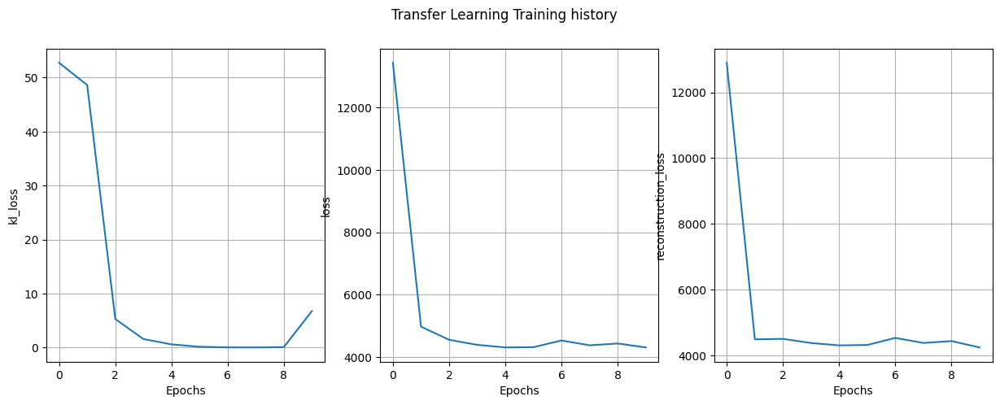

In [ ]:
interest = ['kl_loss', 'loss','reconstruction_loss']
n_values_to_plot = len(interest)
plt.figure(figsize=(15, 5))
for i, key in enumerate(interest):
    plt.subplot(1, n_values_to_plot, i + 1)
    plt.plot(history.history[key])
    plt.xlabel("Epochs")
    plt.ylabel(key)
    plt.grid()
plt.suptitle("Transfer Learning Training history")
plt.show()

In [ ]:
vae.save(os.path.join(proj_dir, 'vae_model_tl.keras'))

In [ ]:
checkpoint_cb = ModelCheckpoint(
    filepath='best_vae.keras',
    monitor='loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

checkpoint_cb_r = ModelCheckpoint(
    filepath='best_rec_vae.keras',
    monitor='reconstruction_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

early_stop = EarlyStopping(
    monitor='loss',
    patience=10,
    restore_best_weights=False,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='loss',
    factor=0.1,
    patience=3,
    min_lr=1e-10,
    verbose=1
)

In [ ]:
base_model.trainable = True

vae.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-5))

history = vae.fit(
    data_generator,
    epochs=50,
    callbacks=[checkpoint_cb,
               reduce_lr,
               early_stop,
               checkpoint_cb_r],
    verbose=1
)

Epoch 1/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 952ms/step - kl_loss: 25.8682 - loss: 4649.1470 - reconstruction_loss: 4390.4644
Epoch 1: loss improved from inf to 4533.83057, saving model to best_vae.keras

Epoch 1: reconstruction_loss improved from inf to 4428.11084, saving model to best_rec_vae.keras
125/125 ━━━━━━━━━━━━━━━━━━━━ 199s 994ms/step - kl_loss: 25.7468 - loss: 4648.2319 - reconstruction_loss: 4390.7632 - learning_rate: 1.0000e-05
Epoch 2/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 781ms/step - kl_loss: 0.7590 - loss: 4408.3916 - reconstruction_loss: 4400.8022
Epoch 2: loss improved from 4533.83057 to 4406.08154, saving model to best_vae.keras

Epoch 2: reconstruction_loss improved from 4428.11084 to 4400.15527, saving model to best_rec_vae.keras
125/125 ━━━━━━━━━━━━━━━━━━━━ 104s 831ms/step - kl_loss: 0.7576 - loss: 4408.3730 - reconstruction_loss: 4400.7974 - learning_rate: 1.0000e-05
Epoch 3/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 781ms/step - kl_loss: 0.3534 - loss: 4429.9219 - reconstruc

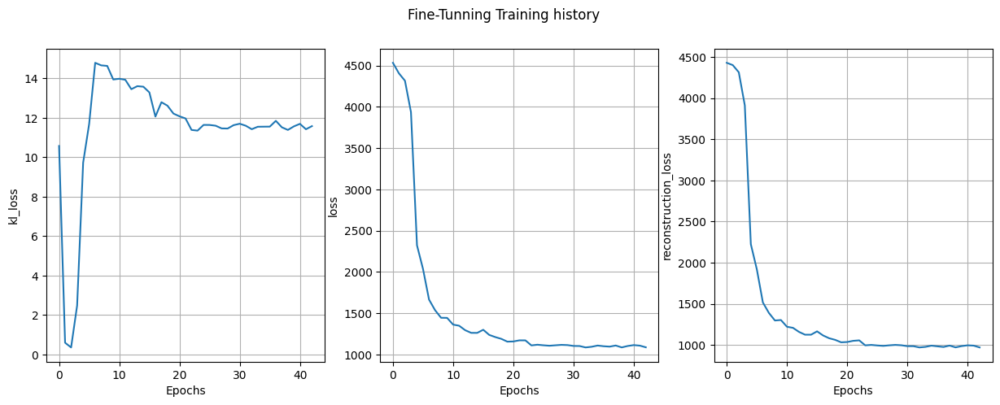

In [ ]:
interest = ['kl_loss', 'loss','reconstruction_loss']
n_values_to_plot = len(interest)
plt.figure(figsize=(15, 5))
for i, key in enumerate(interest):
    plt.subplot(1, n_values_to_plot, i + 1)
    plt.plot(history.history[key])
    plt.xlabel("Epochs")
    plt.ylabel(key)
    plt.grid()
plt.suptitle("Fine-Tunning Training history")
plt.show()

In [ ]:
vae.save(os.path.join(proj_dir, 'vae_model_fn.keras'))

We test the embedding with a random sample image

In [ ]:
vae = keras.models.load_model(os.path.join(proj_dir, 'best_rec_vae.keras'))
encoder = vae.encoder
encoder.summary()

VAE Loss = 1.0 * reconstruction_loss + 10.0 * kl_loss


Model: "vae_encoder_resnet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rgb_adapter         │ (None, 224, 224,  │          9 │ input_layer_1[0]… │
│ (Functional)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ rgb_adapter[0][0] │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 1024)      │  2,098,176 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 512)       │    524,800 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_log_var (Dense)   │ (None, 512)       │    524,800 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sampling (Sampling) │ (None, 512)       │          0 │ z_mean[0][0],     │
│                     │                   │            │ z_log_var[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 26,735,497 (101.99 MB)

 Trainable params: 3,147,785 (12.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
data_df = pd.read_csv(os.path.join(proj_dir, 'songs_images_df.csv'))
data_generator = Tiff2ChannelAutoencoderGenerator(
    data_df,
    batch_size=32,
    shuffle=False,
    augment_fn=None,
    target_size=(512, 512)
)

In [ ]:
X , y = data_generator[0]

embedding = encoder(X)[0]
embedding_numpy = embedding.numpy()[0]

print(f'Embedding shape: {embedding_numpy.shape}')
print(f'Embedding first 10 values:\n{embedding_numpy[:10]}')

Embedding shape: (512,)
Embedding first 10 values:
[ 0.12784295 -0.18238825 -0.02299009 -0.23116192 -0.05997794  0.01899556
  0.08331484  0.04220371 -0.32373998 -0.53730094]


Now we will get the embedding for all the 999 samples and save it as a 999 x 1024 numpy matrix

In [ ]:
class Tiff2ChannelDataGenerator(Sequence):
    def __init__(self, df, batch_size=32, shuffle=True, augment_fn=None, target_size=None):
        """
        df: DataFrame with column 'path'
        batch_size: Number of samples per batch
        shuffle: Whether to shuffle after each epoch
        augment_fn: Optional function to apply augmentation to each image
        target_size: Optional tuple (H, W) to resize each image
        """
        self.df = df.reset_index(drop=True)
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.augment_fn = augment_fn
        self.target_size = target_size
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.df) / self.batch_size))

    def __getitem__(self, index):
        batch_df = self.df.iloc[index * self.batch_size:(index + 1) * self.batch_size]
        y = batch_df['genre'].values
        images = []

        for _, row in batch_df.iterrows():
            img = tifffile.imread(row['path'])  # (H, W, 2) or (2, H, W)

            # Normalize shape to (H, W, 2)
            if img.ndim == 2:
                img = np.expand_dims(img, axis=-1)  # (H, W, 1)
            elif img.ndim == 3 and img.shape[0] == 2:
                img = np.transpose(img, (1, 2, 0))  # (2, H, W) -> (H, W, 2)

            if self.target_size:
                img = tf.image.resize(img, self.target_size).numpy()

            if self.augment_fn:
                img = self.augment_fn(img)

            images.append(img.astype(np.float32))

        X = np.array(images)
        return X, y

    def on_epoch_end(self):
        if self.shuffle:
            self.df = self.df.sample(frac=1).reset_index(drop=True)

In [ ]:
df = pd.read_csv(os.path.join(proj_dir, 'songs_images_df.csv'))
data_gen = Tiff2ChannelDataGenerator(df, batch_size=32, shuffle=False, target_size=(512, 512))
len(data_gen)

32

In [ ]:
vae = keras.models.load_model(os.path.join(proj_dir, 'best_rec_vae.keras'))
encoder = vae.encoder
encoder.summary()

VAE Loss = 1.0 * reconstruction_loss + 10.0 * kl_loss


Model: "vae_encoder_resnet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rgb_adapter         │ (None, 224, 224,  │          9 │ input_layer_4[0]… │
│ (Functional)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ rgb_adapter[0][0] │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[1][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 1024)      │  2,098,176 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 512)       │    524,800 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_log_var (Dense)   │ (None, 512)       │    524,800 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sampling_1          │ (None, 512)       │          0 │ z_mean[0][0],     │
│ (Sampling)          │                   │            │ z_log_var[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 26,735,497 (101.99 MB)

 Trainable params: 3,147,785 (12.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
embeddings = np.zeros(shape=(999,512))
labels = np.zeros(shape=(999), dtype='U20')
i = 0
while i < len(data_gen):
  X, y = data_gen[i]
  embedding = encoder(X)[2]
  embeddings[32*i: 32*i + len(embedding)] = embedding
  labels[32*i: 32*i + len(embedding)] = y
  i+=1
  print(f'{i}/{len(data_gen)} batches processed succesfully')

1/32 batches processed succesfully
2/32 batches processed succesfully
3/32 batches processed succesfully
4/32 batches processed succesfully
5/32 batches processed succesfully
6/32 batches processed succesfully
7/32 batches processed succesfully
8/32 batches processed succesfully
9/32 batches processed succesfully
10/32 batches processed succesfully
11/32 batches processed succesfully
12/32 batches processed succesfully
13/32 batches processed succesfully
14/32 batches processed succesfully
15/32 batches processed succesfully
16/32 batches processed succesfully
17/32 batches processed succesfully
18/32 batches processed succesfully
19/32 batches processed succesfully
20/32 batches processed succesfully
21/32 batches processed succesfully
22/32 batches processed succesfully
23/32 batches processed succesfully
24/32 batches processed succesfully
25/32 batches processed succesfully
26/32 batches processed succesfully
27/32 batches processed succesfully
28/32 batches processed succesfully
2

In [ ]:
print(f'Embeddings shape: {embeddings.shape}')
print(f'Labels shape: {labels.shape}')
print(f'First 10 labels: {labels[:10]}')
print(f'First 3 embeddings 5 elements: {embeddings[:3,:5]}')

Embeddings shape: (999, 512)
Labels shape: (999,)
First 10 labels: ['blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues'
 'blues']
First 3 embeddings 5 elements: [[ 0.71198428 -1.06766224 -0.29540992 -0.0356621   0.3589009 ]
 [-0.54440176  2.11529398  0.36535051 -0.2025401   0.63261616]
 [ 1.61639202  0.61848688  1.28427851 -0.07497658 -0.00686057]]


In [ ]:
embedding_path = os.path.join(proj_dir, 'embeddings.npy')
label_path = os.path.join(proj_dir, 'labels.npy')
np.save(embedding_path, embeddings)
np.save(label_path, labels)

We test that the saved labels and embeddings are ok for the further tasks

In [ ]:
embedding_path = os.path.join(proj_dir, 'embeddings.npy')
label_path = os.path.join(proj_dir, 'labels.npy')

X = np.load(embedding_path)
y = np.load(label_path)

print(f'Embeddings shape: {X.shape}')
print(f'Labels shape: {y.shape}\n')
print(f'Embeddings data type: {X.dtype}')
print(f'Labels data type: {y.dtype}\n')
print(f'First 3 labels:\n{y[:3]}')
print(f'First 3 embeddings 5 elements:\n{X[:3,:5]}')

Embeddings shape: (999, 512)
Labels shape: (999,)

Embeddings data type: float64
Labels data type: <U20

First 3 labels:
['blues' 'blues' 'blues']
First 3 embeddings 5 elements:
[[ 0.71198428 -1.06766224 -0.29540992 -0.0356621   0.3589009 ]
 [-0.54440176  2.11529398  0.36535051 -0.2025401   0.63261616]
 [ 1.61639202  0.61848688  1.28427851 -0.07497658 -0.00686057]]


## Songs reconstruction

Now we will test that the embeddings may be able to reconstruct a song and make it audible

In [ ]:
im_df = pd.read_csv(os.path.join(proj_dir, 'songs_images_df.csv'))
sample = im_df.sample(1)
path = sample['path'].values[0]
print(f'Sample path: {path}')
min_ = sample['min'].values[0]
max_ = sample['max'].values[0]
print(f'Min: {min_}, Max: {max_}')

Sample path: /content/drive/Shareddrives/ML-Proj/songs_imgs/pop.00008.tiff
Min: -3.1415775, Max: 94.2911


In [ ]:
im = tifffile.imread(path)
rec_vae = vae(np.expand_dims(im, axis=0))
rec_vae = rec_vae[0].numpy()
print(rec_vae.shape)

(512, 512, 2)


In [ ]:
rec_vae_ = rec_vae * (max_ - min_) + min_
magnitude = rec_vae_[..., 0]
phase = rec_vae_[..., 1]
reconstructed_stft = magnitude * np.exp(1j * phase)
reconstructed_audio = apply_istft(reconstructed_stft)
sf.write('rec_from_vae.wav', reconstructed_audio, sr)

In [ ]:
im_ = im * (max_ - min_) + min_
magnitude = im_[..., 0]
phase = im_[..., 1]
reconstructed_stft = magnitude * np.exp(1j * phase)
reconstructed_audio = apply_istft(reconstructed_stft)
sf.write('rec_image.wav', reconstructed_audio, sr)

In [ ]:
np.linalg.norm(rec_vae - im)

np.float32(25.011059)

We listen to the original song

In [ ]:
ipd.Audio('rec_image.wav')

We listen to the reconstructed one

In [ ]:
ipd.Audio('rec_from_vae.wav')

We can see that the original audio can not be recovered because of the fine detail needed in reconstruction for the songs magnitude and phase

## Genre classification

In [ ]:
embedding_path = os.path.join(proj_dir, 'embeddings.npy')
label_path = os.path.join(proj_dir, 'labels.npy')

X = np.load(embedding_path)
y = np.load(label_path)
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

r = joblib.dump(label_encoder, os.path.join(proj_dir, 'label_encoder.pkl'))
print(f'Label encoder saved in {r[0]}')

Label encoder saved in /content/drive/Shareddrives/ML-Proj/label_encoder.pkl


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

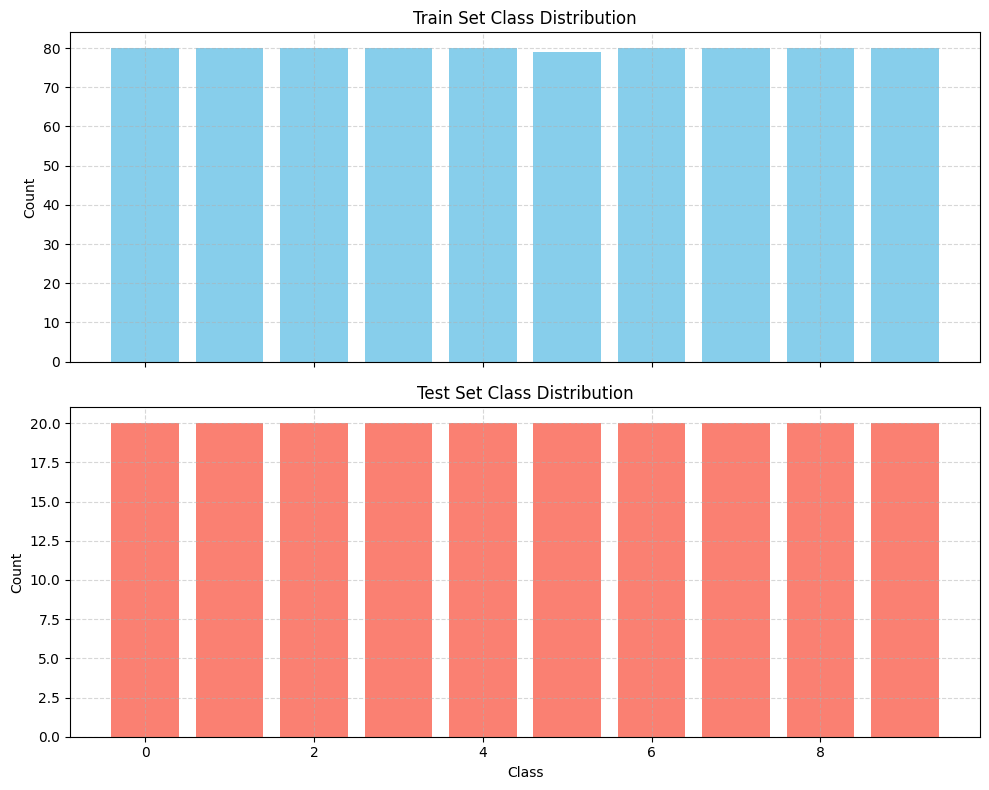

In [ ]:
train_counts = Counter(y_train)
test_counts = Counter(y_test)
classes = sorted(set(y_train) | set(y_test))
train_freqs = [train_counts.get(cls, 0) for cls in classes]
test_freqs = [test_counts.get(cls, 0) for cls in classes]
fig, axs = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
axs[0].bar(classes, train_freqs, color='skyblue')
axs[0].set_title('Train Set Class Distribution')
axs[0].set_ylabel('Count')
axs[0].grid(True, linestyle='--', alpha=0.5)
axs[1].bar(classes, test_freqs, color='salmon')
axs[1].set_title('Test Set Class Distribution')
axs[1].set_xlabel('Class')
axs[1].set_ylabel('Count')
axs[1].grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

For the genre classification, we will use 5 different approachs. These approaches will be:

1. Gaussian Naive-Bayes Classifier from sklearn.
2. RBF Kernel approximation using a support vector machine from sklearn.
3. Polynomial Kernel approximation using a support vector machine from sklearn.
4. K-Nearest Neighbours classifier from sklearn.
5. Neuronal Network from tensorflow keras.
6. XGB classifier from XGB

### Training models and looking for best hyperparameters

#### GNB Classifier

In [ ]:
gnb = GaussianNB()

grid_params = {
    'var_smoothing': np.logspace(0, -18, num=60)
}

grid_search_gnb = GridSearchCV(estimator=gnb, param_grid=grid_params, cv=5, verbose=2)
grid_search_gnb.fit(X_train, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits
[CV] END ..................................var_smoothing=1.0; total time=   0.0s
[CV] END ..................................var_smoothing=1.0; total time=   0.0s
[CV] END ..................................var_smoothing=1.0; total time=   0.0s
[CV] END ..................................var_smoothing=1.0; total time=   0.0s
[CV] END ..................................var_smoothing=1.0; total time=   0.0s
[CV] END ..................var_smoothing=0.49535352089591705; total time=   0.0s
[CV] END ..................var_smoothing=0.49535352089591705; total time=   0.0s
[CV] END ..................var_smoothing=0.49535352089591705; total time=   0.0s
[CV] END ..................var_smoothing=0.49535352089591705; total time=   0.0s
[CV] END ..................var_smoothing=0.49535352089591705; total time=   0.0s
[CV] END ..................var_smoothing=0.24537511066398174; total time=   0.0s
[CV] END ..................var_smoothing=0.2453

GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00000000e+00, 4.95353521e-01, 2.45375111e-01, 1.21547425e-01,
       6.02089449e-02, 2.98247129e-02, 1.47737765e-02, 7.31824222e-03,
       3.62511705e-03, 1.79571449e-03, 8.89513497e-04, 4.40623643e-04,
       2.18264473e-04, 1.08118075e-04, 5.35566692e-05, 2.65294846e-05,
       1.31414736e-05, 6.50967523e-06, 3.22...
       1.03979842e-11, 5.15067808e-12, 2.55140652e-12, 1.26384820e-12,
       6.26051657e-13, 3.10116893e-13, 1.53617495e-13, 7.60949669e-14,
       3.76939098e-14, 1.86718109e-14, 9.24914728e-15, 4.58159767e-15,
       2.26951054e-15, 1.12421004e-15, 5.56881399e-16, 2.75853162e-16,
       1.36644835e-16, 6.76875001e-17, 3.35292415e-17, 1.66088278e-17,
       8.22724134e-18, 4.07539297e-18, 2.01876025e-18, 1.00000000e-18])},
             verbose=2)

In [ ]:
gnb_results = pd.DataFrame(grid_search_gnb.cv_results_)
gnb_results.sort_values(by='rank_test_score', inplace=True)
gnb_results.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_var_smoothing,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
1,0.003556,0.000115,0.003251,0.000222,0.495354,{'var_smoothing': 0.49535352089591705},0.15000,0.15000,0.20000,0.23125,0.201258,0.186502,0.031834,1
2,0.003385,0.000034,0.003127,0.000116,0.245375,{'var_smoothing': 0.24537511066398174},0.15625,0.17500,0.18125,0.22500,0.194969,0.186494,0.022930,2
3,0.003537,0.000138,0.003134,0.000074,0.121547,{'var_smoothing': 0.12154742500762866},0.15625,0.17500,0.16875,0.21250,0.194969,0.181494,0.019924,3
4,0.003788,0.000438,0.003293,0.000428,0.060209,{'var_smoothing': 0.060208944933361284},0.15000,0.15000,0.17500,0.20625,0.188679,0.173986,0.021948,4
0,0.003946,0.000522,0.003339,0.000190,1.000000,{'var_smoothing': 1.0},0.13125,0.13125,0.20000,0.19375,0.207547,0.172759,0.034173,5


In [ ]:
print("Best hyperparams:", grid_search_gnb.best_params_)
print("Best accuracy:", grid_search_gnb.best_score_)

Best hyperparams: {'var_smoothing': np.float64(0.49535352089591705)}
Best accuracy: 0.186501572327044


In [ ]:
r = joblib.dump(grid_search_gnb.best_estimator_,
                os.path.join(proj_dir, 'bestGNB.pkl'))
print(f'GNB best moddel saved at {r[0]}')

GNB best moddel saved at /content/drive/Shareddrives/ML-Proj/bestGNB.pkl


#### KNN Classifier

In [ ]:
knn = KNeighborsClassifier()
params = {
    'n_neighbors': [i for i in range(5, 51, 5)],
    'weights': ['uniform', 'distance'],
    'p': [1, 2, 3, 4]
}
grid_search_knn = GridSearchCV(estimator=knn, param_grid=params, cv=5, verbose=2)
grid_search_knn.fit(X_train, y_train)

Fitting 5 folds for each of 80 candidates, totalling 400 fits
[CV] END ................n_neighbors=5, p=1, weights=uniform; total time=   0.1s
[CV] END ................n_neighbors=5, p=1, weights=uniform; total time=   0.1s
[CV] END ................n_neighbors=5, p=1, weights=uniform; total time=   0.1s
[CV] END ................n_neighbors=5, p=1, weights=uniform; total time=   0.1s
[CV] END ................n_neighbors=5, p=1, weights=uniform; total time=   0.1s
[CV] END ...............n_neighbors=5, p=1, weights=distance; total time=   0.1s
[CV] END ...............n_neighbors=5, p=1, weights=distance; total time=   0.1s
[CV] END ...............n_neighbors=5, p=1, weights=distance; total time=   0.1s
[CV] END ...............n_neighbors=5, p=1, weights=distance; total time=   0.1s
[CV] END ...............n_neighbors=5, p=1, weights=distance; total time=   0.1s
[CV] END ................n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END ................n_neighbors=5, p=2, we

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [5, 10, 15, 20, 25, 30, 35, 40, 45, 50],
                         'p': [1, 2, 3, 4],
                         'weights': ['uniform', 'distance']},
             verbose=2)

In [ ]:
knn_results = pd.DataFrame(grid_search_knn.cv_results_)
knn_results.sort_values(by='rank_test_score', inplace=True)
knn_results.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_neighbors,param_p,param_weights,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
28,0.001703,0.000372,1.564106,0.422470,20,3,uniform,"{'n_neighbors': 20, 'p': 3, 'weights': 'uniform'}",0.17500,0.16250,0.16250,0.16875,0.113208,0.156392,0.022084,1
77,0.001913,0.000195,1.319708,0.217494,50,3,distance,"{'n_neighbors': 50, 'p': 3, 'weights': 'distan...",0.14375,0.11875,0.16875,0.18125,0.163522,0.155204,0.021869,2
44,0.001739,0.000408,1.319700,0.177022,30,3,uniform,"{'n_neighbors': 30, 'p': 3, 'weights': 'uniform'}",0.13750,0.15625,0.15625,0.16250,0.157233,0.153947,0.008545,3
71,0.001979,0.000304,1.329149,0.223152,45,4,distance,"{'n_neighbors': 45, 'p': 4, 'weights': 'distan...",0.13750,0.16250,0.15625,0.17500,0.132075,0.152665,0.015889,4
36,0.001754,0.000410,1.313108,0.171233,25,3,uniform,"{'n_neighbors': 25, 'p': 3, 'weights': 'uniform'}",0.17500,0.15000,0.15000,0.16875,0.119497,0.152649,0.019349,5


In [ ]:
print("Best hyperparams:", grid_search_knn.best_params_)
print("Best accuracy:", grid_search_knn.best_score_)

Best hyperparams: {'n_neighbors': 20, 'p': 3, 'weights': 'uniform'}
Best accuracy: 0.15639150943396224


In [ ]:
r = joblib.dump(grid_search_knn.best_estimator_,
                os.path.join(proj_dir, 'bestKNN.pkl'))
print(f'KNN best moddel saved at {r[0]}')

KNN best moddel saved at /content/drive/Shareddrives/ML-Proj/bestKNN.pkl


#### SVC with RBF Kernel

In [ ]:
svc_rbf = SVC(kernel='rbf')
params_rbf = {
     'C': np.logspace(-2, 3, 6),
    'gamma': np.append(np.logspace(-4, 2, 6), ['scale', 'auto'])
}

grid_rbf = GridSearchCV(
    estimator=svc_rbf, param_grid=params_rbf, cv=5, verbose=2
)

grid_rbf.fit(X_train, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END ...............................C=0.01, gamma=0.0001; total time=   0.0s
[CV] END ...............................C=0.01, gamma=0.0001; total time=   0.0s
[CV] END ...............................C=0.01, gamma=0.0001; total time=   0.0s
[CV] END ...............................C=0.01, gamma=0.0001; total time=   0.0s
[CV] END ...............................C=0.01, gamma=0.0001; total time=   0.0s
[CV] END .................C=0.01, gamma=0.001584893192461114; total time=   0.0s
[CV] END .................C=0.01, gamma=0.001584893192461114; total time=   0.0s
[CV] END .................C=0.01, gamma=0.001584893192461114; total time=   0.0s
[CV] END .................C=0.01, gamma=0.001584893192461114; total time=   0.0s
[CV] END .................C=0.01, gamma=0.001584893192461114; total time=   0.0s
[CV] END .................C=0.01, gamma=0.025118864315095794; total time=   0.0s
[CV] END .................C=0.01, gamma=0.02511

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'gamma': array(['0.0001', '0.001584893192461114', '0.025118864315095794',
       '0.3981071705534969', '6.30957344480193', '100.0', 'scale', 'auto'],
      dtype='<U32')},
             verbose=2)

In [ ]:
svc_rbf_results = pd.DataFrame(grid_rbf.cv_results_)
svc_rbf_results.sort_values(by='rank_test_score', inplace=True)
svc_rbf_results.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
30,0.097248,0.003260,0.038622,0.002798,10.0,scale,"{'C': 10.0, 'gamma': 'scale'}",0.16875,0.1125,0.2125,0.19375,0.176101,0.17272,0.0337,1
31,0.098306,0.005786,0.040488,0.001570,10.0,auto,"{'C': 10.0, 'gamma': 'auto'}",0.16875,0.1125,0.2125,0.19375,0.176101,0.17272,0.0337,1
39,0.093924,0.003874,0.036894,0.002455,100.0,auto,"{'C': 100.0, 'gamma': 'auto'}",0.16875,0.1125,0.2125,0.19375,0.176101,0.17272,0.0337,1
38,0.095301,0.003471,0.038541,0.002225,100.0,scale,"{'C': 100.0, 'gamma': 'scale'}",0.16875,0.1125,0.2125,0.19375,0.176101,0.17272,0.0337,1
46,0.095650,0.005383,0.037613,0.000774,1000.0,scale,"{'C': 1000.0, 'gamma': 'scale'}",0.16875,0.1125,0.2125,0.19375,0.176101,0.17272,0.0337,1


In [ ]:
print("Best hyperparams:", grid_rbf.best_params_)
print("Best accuracy:", grid_rbf.best_score_)

Best hyperparams: {'C': np.float64(10.0), 'gamma': np.str_('scale')}
Best accuracy: 0.17272012578616353


In [ ]:
r = joblib.dump(grid_rbf.best_estimator_,
                os.path.join(proj_dir, 'bestSVC_rbf.pkl'))
print(f'SVC RBF best moddel saved at {r[0]}')

SVC RBF best moddel saved at /content/drive/Shareddrives/ML-Proj/bestSVC_rbf.pkl


#### SVC with polynomial kernel

In [ ]:
svc_poly = SVC(kernel='poly')

params_poly = {
    'C': np.logspace(-2, 2, 5),
    'degree': [2, 3, 4, 5],
    'gamma': np.logspace(-3, 1, 5),
    'coef0': [0.0, 0.5, 1.0, 2.0]
}

grid_poly = GridSearchCV(
    svc_poly, params_poly,
    cv=5, verbose=2
)

grid_poly.fit(X_train, y_train)

Fitting 5 folds for each of 400 candidates, totalling 2000 fits
[CV] END ...........C=0.01, coef0=0.0, degree=2, gamma=0.001; total time=   0.2s
[CV] END ...........C=0.01, coef0=0.0, degree=2, gamma=0.001; total time=   0.2s
[CV] END ...........C=0.01, coef0=0.0, degree=2, gamma=0.001; total time=   0.2s
[CV] END ...........C=0.01, coef0=0.0, degree=2, gamma=0.001; total time=   0.2s
[CV] END ...........C=0.01, coef0=0.0, degree=2, gamma=0.001; total time=   0.2s
[CV] END ............C=0.01, coef0=0.0, degree=2, gamma=0.01; total time=   0.2s
[CV] END ............C=0.01, coef0=0.0, degree=2, gamma=0.01; total time=   0.2s
[CV] END ............C=0.01, coef0=0.0, degree=2, gamma=0.01; total time=   0.2s
[CV] END ............C=0.01, coef0=0.0, degree=2, gamma=0.01; total time=   0.2s
[CV] END ............C=0.01, coef0=0.0, degree=2, gamma=0.01; total time=   0.2s
[CV] END .............C=0.01, coef0=0.0, degree=2, gamma=0.1; total time=   0.2s
[CV] END .............C=0.01, coef0=0.0, degr

GridSearchCV(cv=5, estimator=SVC(kernel='poly'),
             param_grid={'C': array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02]),
                         'coef0': [0.0, 0.5, 1.0, 2.0], 'degree': [2, 3, 4, 5],
                         'gamma': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01])},
             verbose=2)

In [ ]:
svc_rbf_results = pd.DataFrame(grid_poly.cv_results_)
svc_rbf_results.sort_values(by='rank_test_score', inplace=True)
svc_rbf_results.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_coef0,param_degree,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
46,0.102321,0.006862,0.019411,0.000454,0.01,1.0,3,0.01,"{'C': 0.01, 'coef0': 1.0, 'degree': 3, 'gamma'...",0.15625,0.14375,0.16875,0.175,0.213836,0.171517,0.023727,1
126,0.131128,0.021073,0.022673,0.002167,0.10,1.0,3,0.01,"{'C': 0.1, 'coef0': 1.0, 'degree': 3, 'gamma':...",0.15625,0.14375,0.16875,0.175,0.213836,0.171517,0.023727,1
366,0.098133,0.002740,0.019959,0.000272,100.00,1.0,3,0.01,"{'C': 100.0, 'coef0': 1.0, 'degree': 3, 'gamma...",0.15625,0.14375,0.16875,0.175,0.213836,0.171517,0.023727,1
286,0.096307,0.004032,0.019725,0.000211,10.00,1.0,3,0.01,"{'C': 10.0, 'coef0': 1.0, 'degree': 3, 'gamma'...",0.15625,0.14375,0.16875,0.175,0.213836,0.171517,0.023727,1
206,0.097286,0.006170,0.019825,0.000761,1.00,1.0,3,0.01,"{'C': 1.0, 'coef0': 1.0, 'degree': 3, 'gamma':...",0.15625,0.14375,0.16875,0.175,0.213836,0.171517,0.023727,1


In [ ]:
print("Best hyperparams:", grid_poly.best_params_)
print("Best accuracy:", grid_poly.best_score_)

Best hyperparams: {'C': np.float64(0.01), 'coef0': 1.0, 'degree': 3, 'gamma': np.float64(0.01)}
Best accuracy: 0.17151729559748427


In [ ]:
r = joblib.dump(grid_poly.best_estimator_,
                os.path.join(proj_dir, 'bestSVC_poly.pkl'))
print(f'SVC polynomial best moddel saved at {r[0]}')

SVC polynomial best moddel saved at /content/drive/Shareddrives/ML-Proj/bestSVC_poly.pkl


#### XGB Classifier

In [ ]:
xgb_ = xgb.XGBClassifier(learning_rate=0.01)

params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5],
}

grid_search_xgb = GridSearchCV(estimator=xgb_, param_grid=params, cv=5, verbose=2)
grid_search_xgb.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END ......................max_depth=3, n_estimators=100; total time=  23.8s
[CV] END ......................max_depth=3, n_estimators=100; total time=  23.5s
[CV] END ......................max_depth=3, n_estimators=100; total time=  24.1s
[CV] END ......................max_depth=3, n_estimators=100; total time=  21.7s
[CV] END ......................max_depth=3, n_estimators=100; total time=  23.7s
[CV] END ......................max_depth=3, n_estimators=200; total time=  48.8s
[CV] END ......................max_depth=3, n_estimators=200; total time=  45.6s
[CV] END ......................max_depth=3, n_estimators=200; total time=  47.7s
[CV] END ......................max_depth=3, n_estimators=200; total time=  45.3s
[CV] END ......................max_depth=3, n_estimators=200; total time=  48.3s
[CV] END ......................max_depth=3, n_estimators=300; total time= 1.2min
[CV] END ......................max_depth=3, n_est

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, feature_weights=None,
                                     gamma=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.01, max_bin=None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None, ...),
             param_grid={'max_depth': [3, 5], 'n_estimators': [100, 200, 300]},
             verbose=2)

In [ ]:
svc_xgb_results = pd.DataFrame(grid_search_xgb.cv_results_)
svc_xgb_results.sort_values(by='rank_test_score', inplace=True)
svc_xgb_results.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
2,69.833334,0.782817,0.008294,0.000984,3,300,"{'max_depth': 3, 'n_estimators': 300}",0.11875,0.1250,0.12500,0.11875,0.132075,0.123915,0.004946,1
4,125.895046,2.145766,0.012384,0.003373,5,200,"{'max_depth': 5, 'n_estimators': 200}",0.08750,0.0875,0.13125,0.15000,0.157233,0.122697,0.029963,2
5,192.591798,10.773005,0.021268,0.013368,5,300,"{'max_depth': 5, 'n_estimators': 300}",0.08750,0.0875,0.13750,0.14375,0.144654,0.120181,0.026797,3
1,47.146982,1.417289,0.005906,0.000165,3,200,"{'max_depth': 3, 'n_estimators': 200}",0.08125,0.1250,0.13125,0.10000,0.138365,0.115173,0.021326,4
3,63.681683,1.200588,0.006248,0.000368,5,100,"{'max_depth': 5, 'n_estimators': 100}",0.06875,0.1000,0.12500,0.13125,0.113208,0.107642,0.022184,5


In [ ]:
print("Best hyperparams:", grid_search_xgb.best_params_)
print("Best accuracy:", grid_search_xgb.best_score_)

Best hyperparams: {'max_depth': 3, 'n_estimators': 300}
Best accuracy: 0.12391509433962264


In [ ]:
r = joblib.dump(grid_search_xgb.best_estimator_,
                os.path.join(proj_dir, 'bestXGB.pkl'))
print(f'XGB best moddel saved at {r[0]}')

XGB best moddel saved at /content/drive/Shareddrives/ML-Proj/bestXGB.pkl


#### Keras Classifier

As we can see, the model performance is very poor using the latent space as features for classifying, then we will update the encoders weights in order to make a better classification

In [ ]:
df = pd.read_csv(os.path.join(proj_dir, 'songs_images_df.csv'))
label_encoder = joblib.load(os.path.join(proj_dir, 'label_encoder.pkl'))
df['genre'] = label_encoder.transform(df['genre'])
print(df['genre'].head())
df_, df_test = train_test_split(df, test_size=0.2, random_state=42)
df_train, df_val = train_test_split(df_, test_size=0.1, random_state=42)
data_gen = Tiff2ChannelDataGenerator(df_train, batch_size=32, shuffle=True, target_size=(512, 512))
val_gen = Tiff2ChannelDataGenerator(df_val, batch_size=32, shuffle=False, target_size=(512, 512))
test_gen = Tiff2ChannelDataGenerator(df_test, batch_size=32, shuffle=False, target_size=(512, 512))
len(data_gen) , len(val_gen)

0    0
1    0
2    0
3    0
4    0
Name: genre, dtype: int64


(23, 3)

In [ ]:
def genreClassifier(input_shape=(512, 512, 2), genres=10):
    model_inputs = keras.Input(shape=input_shape)
    encoder = keras.models.load_model(os.path.join(proj_dir, 'best_rec_vae.keras')).encoder
    encoder.trainable = False

    z_m, z_log_var, x = encoder(model_inputs)
    x = layers.Dense(2048, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.1)(x)
    outputs = layers.Dense(genres, activation='softmax')(x)
    return keras.Model(model_inputs, outputs, name="genre_classifier")

In [ ]:
model = genreClassifier()
model.summary()

VAE Loss = 1.0 * reconstruction_loss + 10.0 * kl_loss


Model: "genre_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_42 (InputLayer)     │ (None, 512, 512, 2)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vae_encoder_resnet (Functional) │ [(None, 512), (None,   │    26,735,497 │
│                                 │ 512), (None, 512)]     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 2048)           │     1,050,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 10)             │        20,490 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,814,803 (106.11 MB)

 Trainable params: 1,075,210 (4.10 MB)

 Non-trainable params: 26,739,593 (102.00 MB)

In [ ]:
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    loss=keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

In [ ]:
h = model.fit(
    data_gen,
    epochs=10,
    verbose=1,
    validation_data=val_gen
)

Epoch 1/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.1125 - loss: 3.0669 - val_accuracy: 0.0750 - val_loss: 2.5026
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 13s 571ms/step - accuracy: 0.1228 - loss: 3.0375 - val_accuracy: 0.1125 - val_loss: 2.3894
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 13s 584ms/step - accuracy: 0.1679 - loss: 2.8242 - val_accuracy: 0.1125 - val_loss: 2.5371
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 13s 569ms/step - accuracy: 0.1616 - loss: 2.8368 - val_accuracy: 0.1625 - val_loss: 2.2801
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 737ms/step - accuracy: 0.1421 - loss: 2.7146 - val_accuracy: 0.1375 - val_loss: 2.4650
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 13s 569ms/step - accuracy: 0.1594 - loss: 2.7002 - val_accuracy: 0.1500 - val_loss: 2.5900
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 13s 575ms/step - accuracy: 0.1591 - loss: 2.5972 - val_accuracy: 0.0875 - val_loss: 2.5929
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 20s 568ms/step - accuracy: 0.1936 - loss: 2.5782 - val_accurac

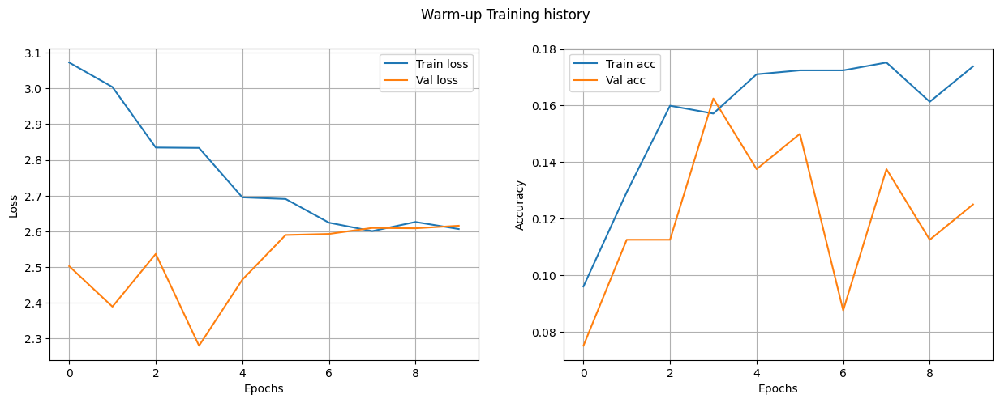

In [ ]:
history = h.history
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(history['loss'], label='Train loss')
plt.plot(history['val_loss'], label='Val loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.subplot(1, 2, 2)
plt.plot(history['accuracy'], label='Train acc')
plt.plot(history['val_accuracy'], label='Val acc')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.suptitle("Warm-up Training history")
plt.legend()
plt.grid()
plt.show()

In [ ]:
callbacks = [
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=False,
        verbose=1
    ),
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.1,
        patience=3,
        min_lr=1e-10,
        verbose=1
    ),
    keras.callbacks.ModelCheckpoint(
        os.path.join(proj_dir, 'best_genre_classifier.keras'),
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )
]

def unfreeze_model(model):
    """
    Recursively sets all layers in the model (including nested models) to trainable=True.
    Returns the uncompiled model for fine-tuning.
    """
    model.trainable = True
    for layer in model.layers:
        layer.trainable = True
        if isinstance(layer, keras.Model):
            unfreeze_model(layer)
    return model

model_unfreezed = unfreeze_model(model)
model_unfreezed.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss=keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)
model_unfreezed.summary()

Model: "genre_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_42 (InputLayer)     │ (None, 512, 512, 2)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vae_encoder_resnet (Functional) │ [(None, 512), (None,   │    26,735,497 │
│                                 │ 512), (None, 512)]     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 2048)           │     1,050,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 10)             │        20,490 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,814,803 (106.11 MB)

 Trainable params: 27,757,587 (105.89 MB)

 Non-trainable params: 57,216 (223.50 KB)

In [ ]:
h = model_unfreezed.fit(
    data_gen,
    epochs=100,
    verbose=1,
    validation_data=val_gen,
    callbacks=callbacks
)

Epoch 1/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.1624 - loss: 2.6578
Epoch 1: val_loss improved from inf to 2.42741, saving model to /content/drive/Shareddrives/ML-Proj/best_genre_classifier.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 123s 2s/step - accuracy: 0.1634 - loss: 2.6557 - val_accuracy: 0.1625 - val_loss: 2.4274 - learning_rate: 1.0000e-05
Epoch 2/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2003 - loss: 2.4963
Epoch 2: val_loss did not improve from 2.42741
23/23 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 0.2008 - loss: 2.4943 - val_accuracy: 0.0750 - val_loss: 2.6349 - learning_rate: 1.0000e-05
Epoch 3/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 814ms/step - accuracy: 0.2000 - loss: 2.5164
Epoch 3: val_loss did not improve from 2.42741
23/23 ━━━━━━━━━━━━━━━━━━━━ 34s 876ms/step - accuracy: 0.2002 - loss: 2.5145 - val_accuracy: 0.1500 - val_loss: 2.4343 - learning_rate: 1.0000e-05
Epoch 4/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 787ms/step - accuracy: 0.2255 - loss: 2.3484
Epo

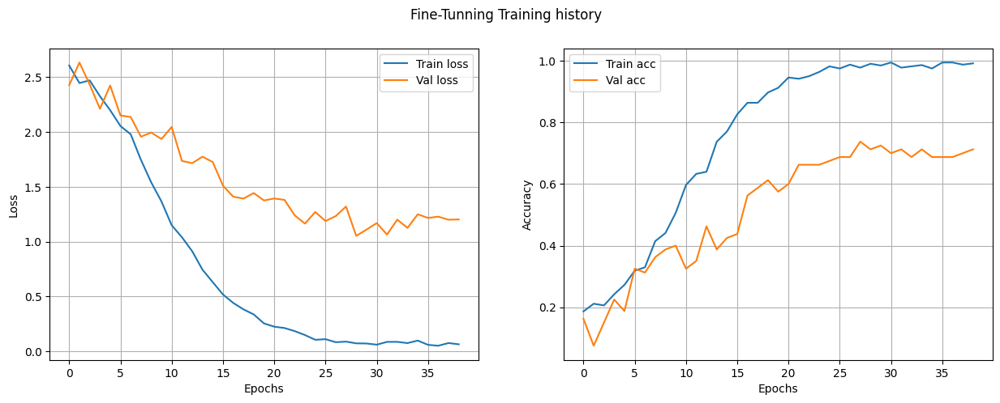

In [ ]:
history = h.history
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(history['loss'], label='Train loss')
plt.plot(history['val_loss'], label='Val loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.subplot(1, 2, 2)
plt.plot(history['accuracy'], label='Train acc')
plt.plot(history['val_accuracy'], label='Val acc')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.suptitle("Fine-Tunning Training history")
plt.legend()
plt.grid()
plt.show()

In [ ]:
model_unfreezed.save(os.path.join(proj_dir, 'final_genre_classifier.keras'))

### Models Evaluation

In [ ]:
df = pd.read_csv(os.path.join(proj_dir, 'songs_images_df.csv'))
label_encoder = joblib.load(os.path.join(proj_dir, 'label_encoder.pkl'))
df['genre'] = label_encoder.transform(df['genre'])
print(df['genre'].head())
_ , df_test = train_test_split(df, test_size=0.2, random_state=42)
test_gen = Tiff2ChannelDataGenerator(df_test, batch_size=32, shuffle=False, target_size=(512, 512))
len(test_gen)

0    0
1    0
2    0
3    0
4    0
Name: genre, dtype: int64


7

In [ ]:
embedding_path = os.path.join(proj_dir, 'embeddings.npy')
label_path = os.path.join(proj_dir, 'labels.npy')

X = np.load(embedding_path)
y = np.load(label_path)
label_encoder = joblib.load(os.path.join(proj_dir, 'label_encoder.pkl'))
y = label_encoder.transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [ ]:
def getKerasModelsReport(model, model_name=''):
  y_pred_probs = model.predict(test_gen)
  y_test = df_test['genre']
  preds = np.argmax(y_pred_probs, axis=1)
  cm = confusion_matrix(y_test, preds)
  plt.figure(figsize=(10, 8))
  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
  plt.xlabel('Predicted')
  plt.ylabel('True')
  plt.title(f'Confusion Matrix for {model_name}')
  plt.show()
  print(classification_report(y_test, preds, target_names=label_encoder.classes_))

  lb = LabelBinarizer()
  y_true_bin = lb.fit_transform(y_test)
  plt.figure(figsize=(10, 8))
  roc_aucs = {}
  for i, cls in enumerate(label_encoder.classes_):
      fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_probs[:, i])
      roc_aucs[cls] = auc(fpr, tpr)
      plt.plot(fpr, tpr, label=f'{cls} (AUC = {roc_aucs[cls]:.2f})')
  plt.plot([0, 1], [0, 1], 'k--', label='Aleatorio')
  plt.title(f'ROC curve for {model_name}')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.legend(loc='lower right')
  plt.grid(True)
  plt.show()

  print("AUC per class:")
  for cls, a in roc_aucs.items():
      print(f"  {cls}: {a:.3f}")

def getClassicModelsReport(model, model_name=''):
  preds = model.predict(X_test)
  cm = confusion_matrix(y_test, preds)
  plt.figure(figsize=(10, 8))
  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
  plt.xlabel('Predicted')
  plt.ylabel('True')
  plt.title(f'Confusion Matrix for {model_name}')
  plt.show()
  print(classification_report(y_test, preds, target_names=label_encoder.classes_))
  if hasattr(model, 'predict_proba'):
    lb = LabelBinarizer()
    y_pred_probs = model.predict_proba(X_test)
    y_true_bin = lb.fit_transform(y_test)
    plt.figure(figsize=(10, 8))
    roc_aucs = {}
    for i, cls in enumerate(label_encoder.classes_):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_probs[:, i])
        roc_aucs[cls] = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{cls} (AUC = {roc_aucs[cls]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', label='Aleatorio')
    plt.title(f'ROC curve for {model_name}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

    print("AUC per class:")
    for cls, a in roc_aucs.items():
        print(f"  {cls}: {a:.3f}")

#### GNB Classifier

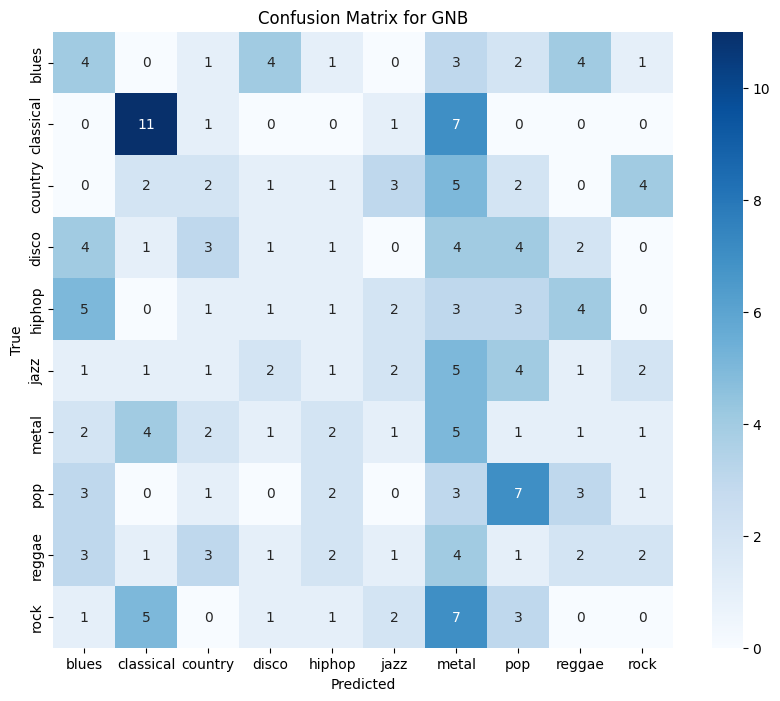

              precision    recall  f1-score   support

       blues       0.17      0.20      0.19        20
   classical       0.44      0.55      0.49        20
     country       0.13      0.10      0.11        20
       disco       0.08      0.05      0.06        20
      hiphop       0.08      0.05      0.06        20
        jazz       0.17      0.10      0.12        20
       metal       0.11      0.25      0.15        20
         pop       0.26      0.35      0.30        20
      reggae       0.12      0.10      0.11        20
        rock       0.00      0.00      0.00        20

    accuracy                           0.17       200
   macro avg       0.16      0.17      0.16       200
weighted avg       0.16      0.17      0.16       200



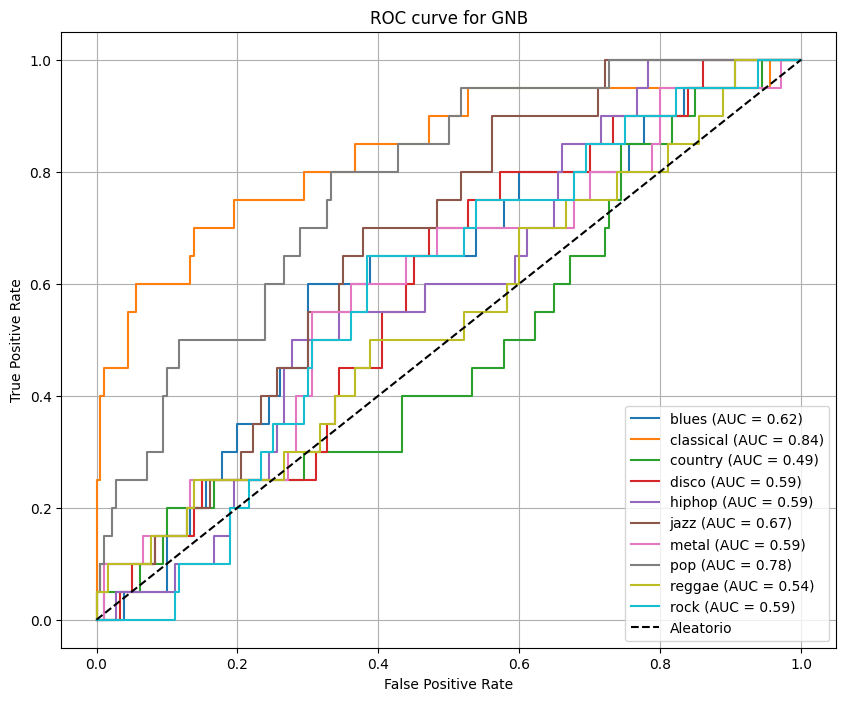

AUC per class:
  blues: 0.616
  classical: 0.837
  country: 0.490
  disco: 0.591
  hiphop: 0.588
  jazz: 0.674
  metal: 0.594
  pop: 0.779
  reggae: 0.539
  rock: 0.586


In [ ]:
m = joblib.load(os.path.join(proj_dir, 'bestGNB.pkl'))
getClassicModelsReport(m, 'GNB')

#### KNN Classifier

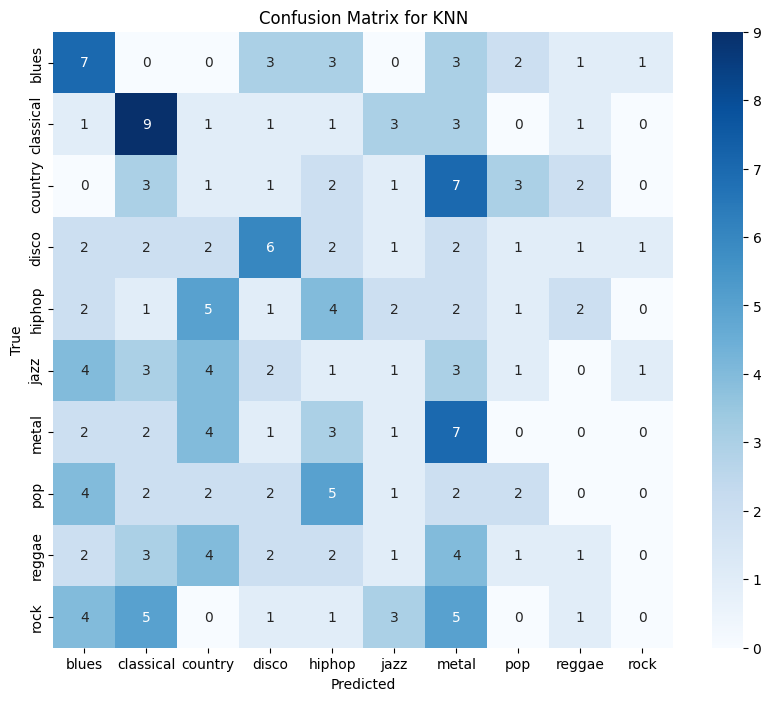

              precision    recall  f1-score   support

       blues       0.25      0.35      0.29        20
   classical       0.30      0.45      0.36        20
     country       0.04      0.05      0.05        20
       disco       0.30      0.30      0.30        20
      hiphop       0.17      0.20      0.18        20
        jazz       0.07      0.05      0.06        20
       metal       0.18      0.35      0.24        20
         pop       0.18      0.10      0.13        20
      reggae       0.11      0.05      0.07        20
        rock       0.00      0.00      0.00        20

    accuracy                           0.19       200
   macro avg       0.16      0.19      0.17       200
weighted avg       0.16      0.19      0.17       200



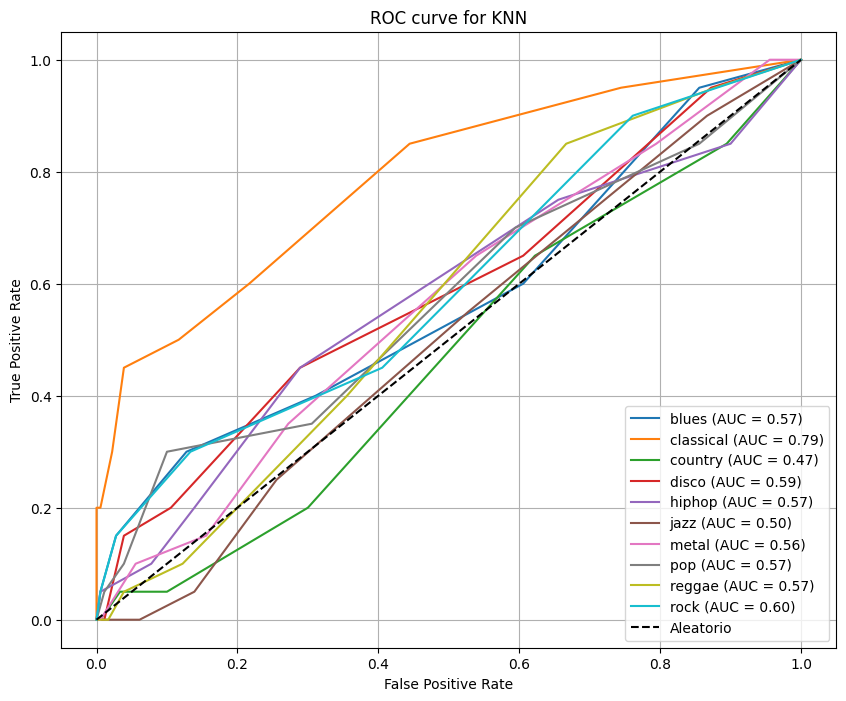

AUC per class:
  blues: 0.571
  classical: 0.788
  country: 0.468
  disco: 0.585
  hiphop: 0.572
  jazz: 0.501
  metal: 0.563
  pop: 0.569
  reggae: 0.569
  rock: 0.595


In [ ]:
m = joblib.load(os.path.join(proj_dir, 'bestKNN.pkl'))
getClassicModelsReport(m, 'KNN')

#### SVC with RBF Kernel

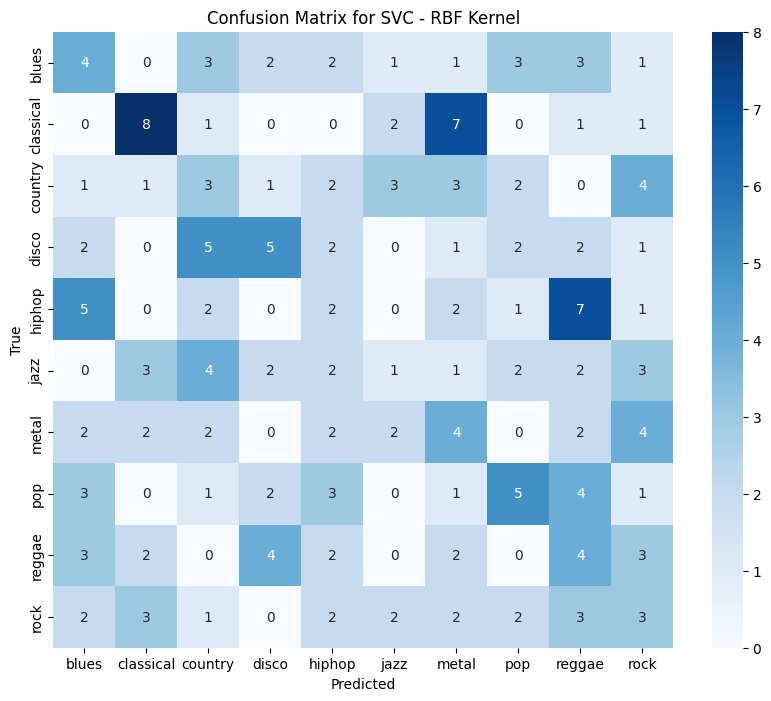

              precision    recall  f1-score   support

       blues       0.18      0.20      0.19        20
   classical       0.42      0.40      0.41        20
     country       0.14      0.15      0.14        20
       disco       0.31      0.25      0.28        20
      hiphop       0.11      0.10      0.10        20
        jazz       0.09      0.05      0.06        20
       metal       0.17      0.20      0.18        20
         pop       0.29      0.25      0.27        20
      reggae       0.14      0.20      0.17        20
        rock       0.14      0.15      0.14        20

    accuracy                           0.20       200
   macro avg       0.20      0.20      0.20       200
weighted avg       0.20      0.20      0.20       200



In [ ]:
m = joblib.load(os.path.join(proj_dir, 'bestSVC_rbf.pkl'))
getClassicModelsReport(m, 'SVC - RBF Kernel')

#### SVC with polynomial Kernel

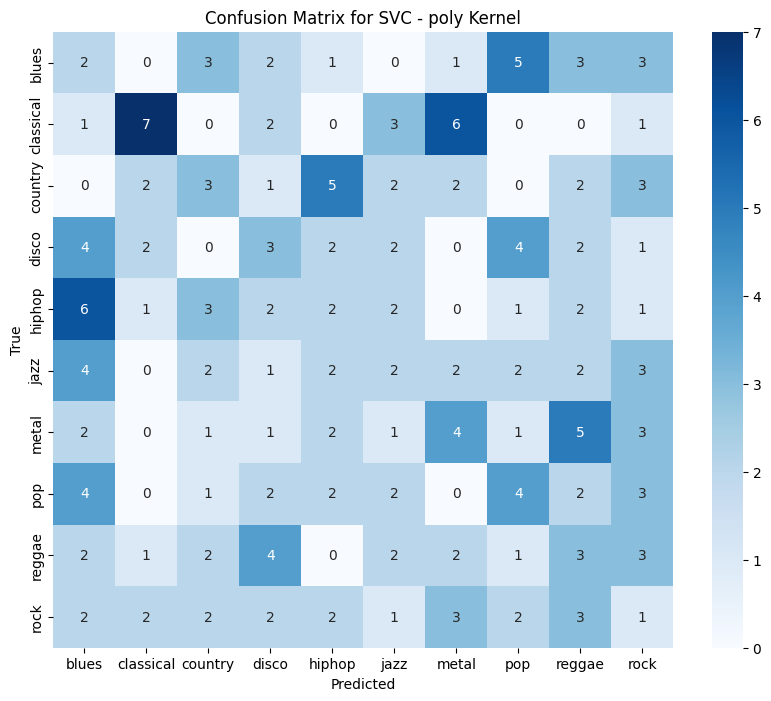

              precision    recall  f1-score   support

       blues       0.07      0.10      0.09        20
   classical       0.47      0.35      0.40        20
     country       0.18      0.15      0.16        20
       disco       0.15      0.15      0.15        20
      hiphop       0.11      0.10      0.11        20
        jazz       0.12      0.10      0.11        20
       metal       0.20      0.20      0.20        20
         pop       0.20      0.20      0.20        20
      reggae       0.12      0.15      0.14        20
        rock       0.05      0.05      0.05        20

    accuracy                           0.15       200
   macro avg       0.17      0.15      0.16       200
weighted avg       0.17      0.15      0.16       200



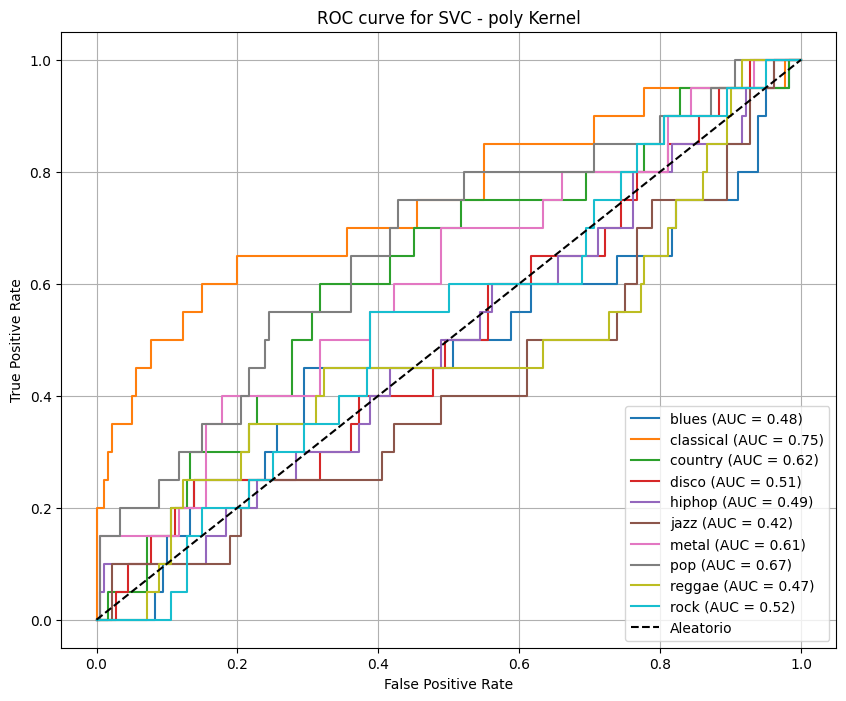

AUC per class:
  blues: 0.478
  classical: 0.746
  country: 0.619
  disco: 0.507
  hiphop: 0.493
  jazz: 0.419
  metal: 0.605
  pop: 0.666
  reggae: 0.473
  rock: 0.524


In [ ]:
m = joblib.load(os.path.join(proj_dir, 'bestSVC_poly.pkl'))
getClassicModelsReport(m, 'SVC - poly Kernel')

#### XGB Classifier

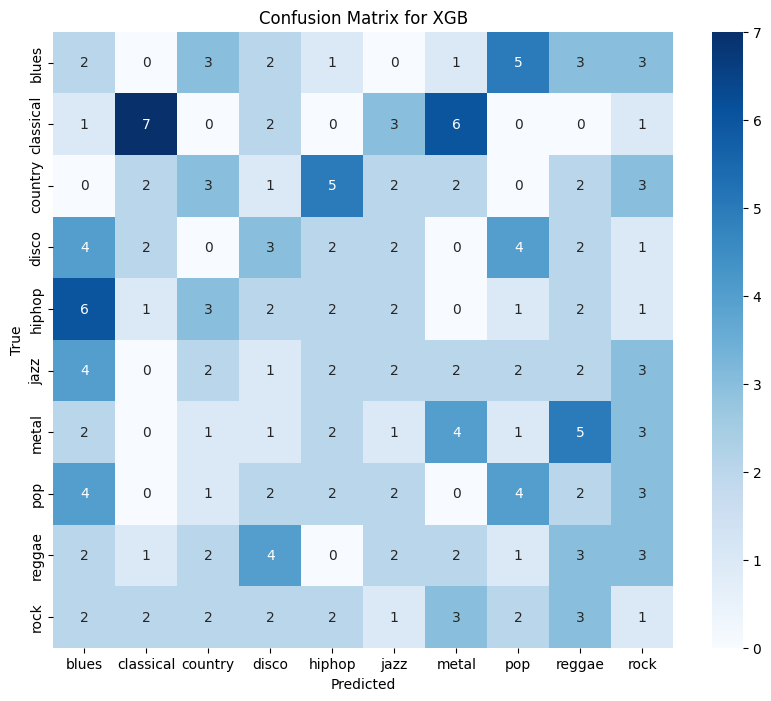

              precision    recall  f1-score   support

       blues       0.07      0.10      0.09        20
   classical       0.47      0.35      0.40        20
     country       0.18      0.15      0.16        20
       disco       0.15      0.15      0.15        20
      hiphop       0.11      0.10      0.11        20
        jazz       0.12      0.10      0.11        20
       metal       0.20      0.20      0.20        20
         pop       0.20      0.20      0.20        20
      reggae       0.12      0.15      0.14        20
        rock       0.05      0.05      0.05        20

    accuracy                           0.15       200
   macro avg       0.17      0.15      0.16       200
weighted avg       0.17      0.15      0.16       200



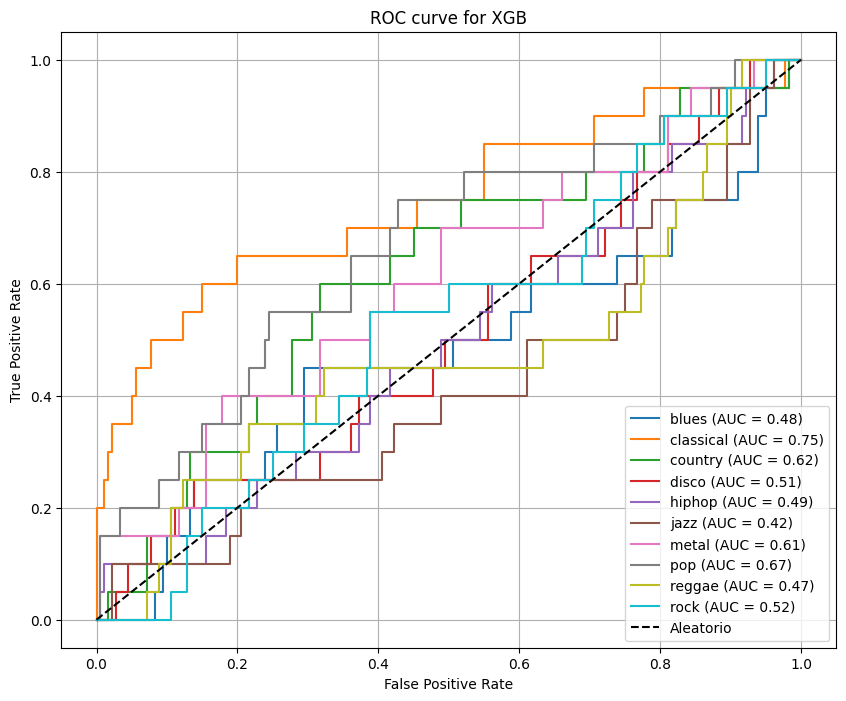

AUC per class:
  blues: 0.478
  classical: 0.746
  country: 0.619
  disco: 0.507
  hiphop: 0.493
  jazz: 0.419
  metal: 0.605
  pop: 0.666
  reggae: 0.473
  rock: 0.524


In [ ]:
m = joblib.load(os.path.join(proj_dir, 'bestXGB.pkl'))
getClassicModelsReport(m, 'XGB')

#### Keras Classifier

7/7 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step


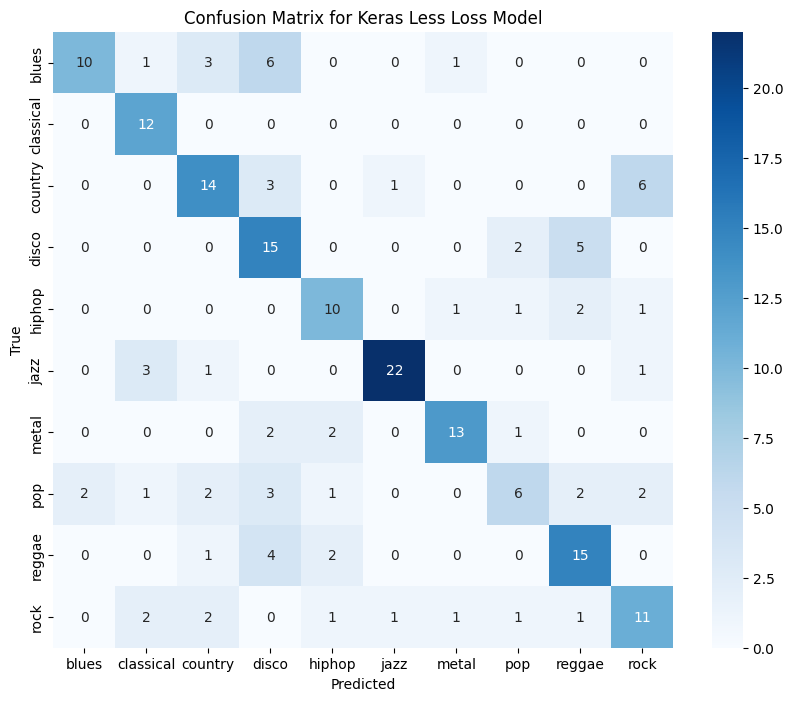

              precision    recall  f1-score   support

       blues       0.83      0.48      0.61        21
   classical       0.63      1.00      0.77        12
     country       0.61      0.58      0.60        24
       disco       0.45      0.68      0.55        22
      hiphop       0.62      0.67      0.65        15
        jazz       0.92      0.81      0.86        27
       metal       0.81      0.72      0.76        18
         pop       0.55      0.32      0.40        19
      reggae       0.60      0.68      0.64        22
        rock       0.52      0.55      0.54        20

    accuracy                           0.64       200
   macro avg       0.66      0.65      0.64       200
weighted avg       0.66      0.64      0.64       200



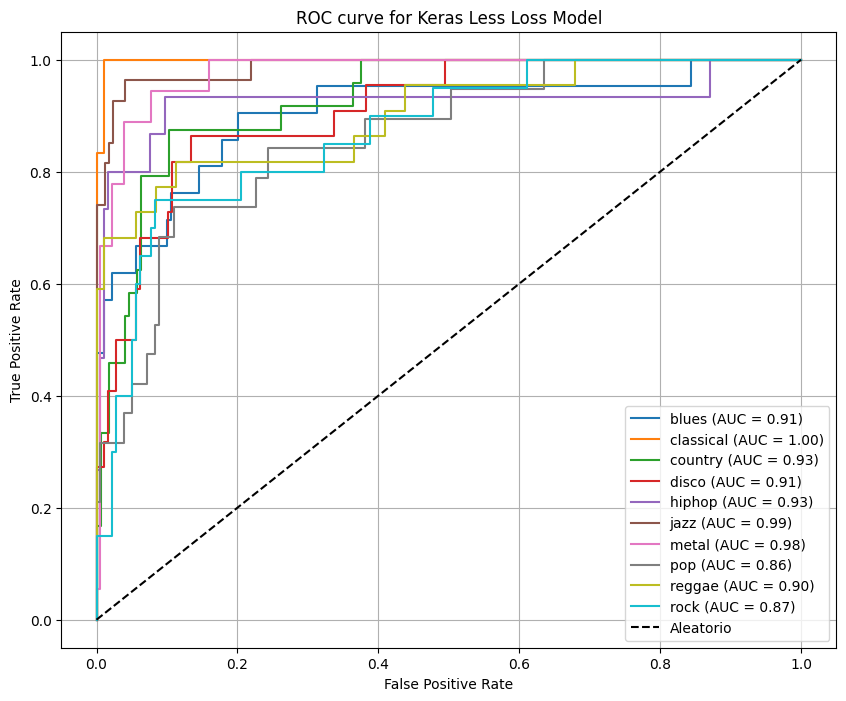

AUC per class:
  blues: 0.905
  classical: 0.998
  country: 0.929
  disco: 0.909
  hiphop: 0.925
  jazz: 0.987
  metal: 0.977
  pop: 0.862
  reggae: 0.901
  rock: 0.872


In [ ]:
m = keras.models.load_model(os.path.join(proj_dir, 'best_genre_classifier.keras'))
getKerasModelsReport(m, 'Keras Less Loss Model')

7/7 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step


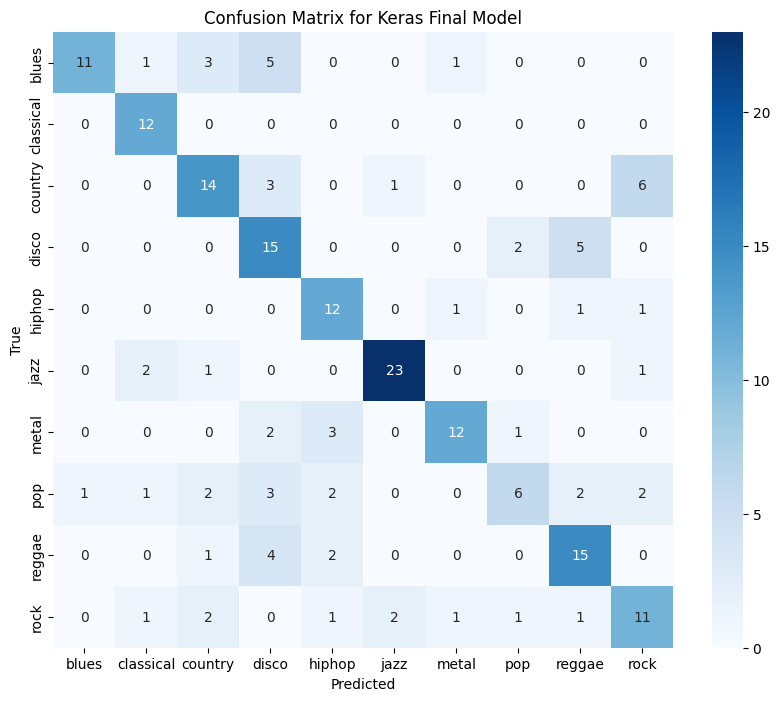

              precision    recall  f1-score   support

       blues       0.92      0.52      0.67        21
   classical       0.71      1.00      0.83        12
     country       0.61      0.58      0.60        24
       disco       0.47      0.68      0.56        22
      hiphop       0.60      0.80      0.69        15
        jazz       0.88      0.85      0.87        27
       metal       0.80      0.67      0.73        18
         pop       0.60      0.32      0.41        19
      reggae       0.62      0.68      0.65        22
        rock       0.52      0.55      0.54        20

    accuracy                           0.66       200
   macro avg       0.67      0.67      0.65       200
weighted avg       0.68      0.66      0.65       200



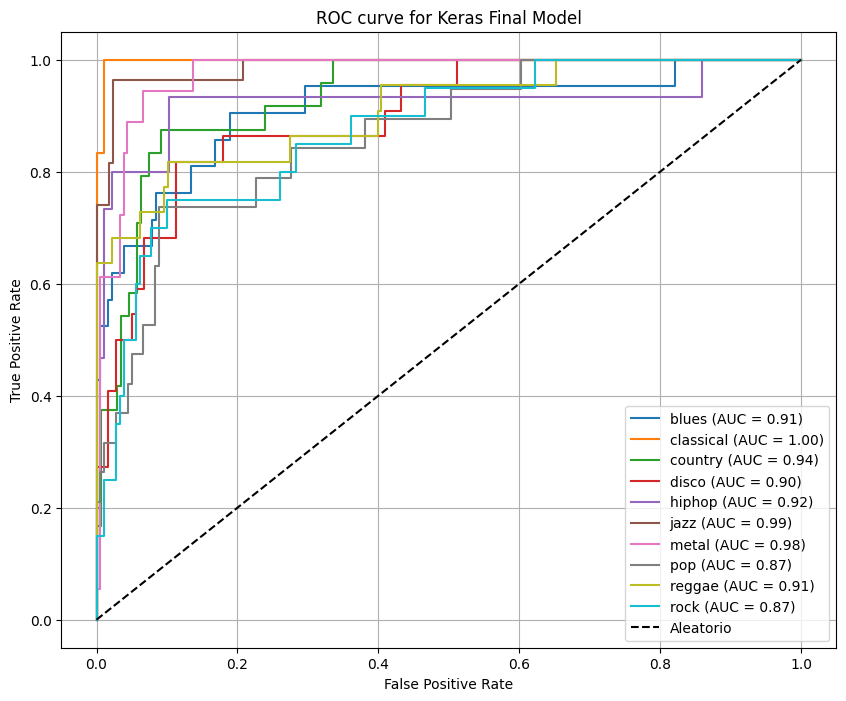

AUC per class:
  blues: 0.911
  classical: 0.998
  country: 0.935
  disco: 0.899
  hiphop: 0.923
  jazz: 0.988
  metal: 0.975
  pop: 0.867
  reggae: 0.909
  rock: 0.873


In [ ]:
m = keras.models.load_model(os.path.join(proj_dir, 'final_genre_classifier.keras'))
getKerasModelsReport(m, 'Keras Final Model')

As a final experiment, we will take a pair of popular songs of classic and metal genre and try to make the classification using our model. We will use `Lacrimosa` from Wolfang Amadeus Mozart and `The Trooper` from iron Maiden

In [ ]:
ipd.Audio(os.path.join(proj_dir, 'classification_new_samples',
                       'the_trooper.wav'))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
ipd.Audio(os.path.join(proj_dir, 'classification_new_samples',
                       'lacrimosa.wav'))

Output hidden; open in https://colab.research.google.com to view.

We will get the corresponding image related to each song

In [ ]:
example_song_path = os.path.join(proj_dir, 'classification_new_samples', 'the_trooper.wav')
img_path, length, sr, min_, max_ = audio_to_img_2ch(example_song_path, filename="the_trooper")
print(f"Image path: {img_path}")

Image path: ./the_trooper.tiff


In [ ]:
example_song_path = os.path.join(proj_dir, 'classification_new_samples', 'lacrimosa.wav')
img_path, length, sr, min_, max_ = audio_to_img_2ch(example_song_path, filename="lacrimosa")
print(f"Image path: {img_path}")

Image path: ./lacrimosa.tiff


In [ ]:
df = pd.DataFrame(
    {
        'path' : ['./the_trooper.tiff', './lacrimosa.tiff'],
        'genre_': ['metal','classical']
    }
)

label_encoder = joblib.load(os.path.join(proj_dir, 'label_encoder.pkl'))
df['genre'] = label_encoder.transform(df['genre_'])

print(df.head())

gen = Tiff2ChannelDataGenerator(df, batch_size=1, shuffle=False, target_size=(512, 512))

                 path     genre_  genre
0  ./the_trooper.tiff      metal      6
1    ./lacrimosa.tiff  classical      1


In [ ]:
model = keras.models.load_model(os.path.join(proj_dir, 'final_genre_classifier.keras'))
preds = model.predict(gen)
preds = np.argmax(preds, axis=1)
df['genre pred'] = label_encoder.inverse_transform(preds)
df[['path','genre_','genre pred']]

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step


,path,genre_,genre pred
0,./the_trooper.tiff,metal,rock
1,./lacrimosa.tiff,classical,classical


As we can see, the model classified correctly the Mozart song, but not the Iron Maiden one. However, is it common even for real people to confuse metal and rock songs.

## Songs similarity

### Study case

As a final experiment, we will attempt to check if the euclidian distance in the latent space is a good criteria to checksong similarity.

For this exercise, we will use the following songs:

1. **Joe Satriani – _If I Could Fly_**  
   **Coldplay – _Viva la Vida_**

2. **Huey Lewis & The News – _I Want a New Drug_**  
   **Ray Parker Jr. – _Ghostbusters_**

3. **The Rolling Stones (Andrew Oldham Orchestra) – _The Last Time_**  
   **The Verve – _Bitter Sweet Symphony_**

4. **Queen – _Under Pressure_**  
   **Vanilla Ice – _Ice Ice Baby_**

5. **Shakira – _Hips Don't Lie_**  
   **Jerry Rivera – _Amores Como el Nuestro_**

6. **David Guetta ft. Ne-Yo & Akon – _Play Hard_**  
   **Alice Deejay – _Better Off Alone_**



These samples were chosen due to the historical impact that its similarity have had in the legal music industry.

In [ ]:
simil_dir = os.path.join(proj_dir, 'songs_similarity')
!ls -al {simil_dir}

total 62022
-rw------- 1 root root 5292228 Jul 24 20:45 'Alice Deejay - Better Off Alone.wav'
-rw------- 1 root root 5292208 Jul 24 20:11 'Coldplay - Viva la Vida (Lyrics).wav'
-rw------- 1 root root 5292078 Jul 24 20:11 'Huey Lewis & The News - I Want A New Drug.wav'
-rw------- 1 root root 5292078 Jul 24 20:02 'If I Could Fly.wav'
-rw------- 1 root root 5292238 Jul 24 20:22 'Jerry Rivera - Amores Como el Nuestro.wav'
-rw------- 1 root root 5292272 Jul 24 20:45 'Play Hard (feat. Ne-Yo & Akon).wav'
-rw------- 1 root root 5292220 Jul 24 20:56 'Queen - Under Pressure.wav'
-rw------- 1 root root 5292232 Jul 24 20:11 'Ray Parker Jr. - Ghostbusters.wav'
-rw------- 1 root root 5292234 Jul 24 20:22 'Shakira - Hips Dont Lie.wav'
-rw------- 1 root root 5292078 Jul 24 20:33 'The Last Time - The Andrew Oldham Orchestra.wav'
-rw------- 1 root root 5292208 Jul 24 20:33 'The Verve - Bitter Sweet Symphony.wav'
-rw------- 1 root root 5292226 Jul 24 20:56 'Vanilla Ice - Ice Ice Baby.wav'


#### Case 1

In [ ]:
ipd.Audio(os.path.join(simil_dir,'If I Could Fly.wav'))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
ipd.Audio(os.path.join(simil_dir,'Coldplay - Viva la Vida (Lyrics).wav'))

Output hidden; open in https://colab.research.google.com to view.

#### Case 2

In [ ]:
ipd.Audio(os.path.join(simil_dir,'Huey Lewis & The News - I Want A New Drug.wav'))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
ipd.Audio(os.path.join(simil_dir,'Ray Parker Jr. - Ghostbusters.wav'))

Output hidden; open in https://colab.research.google.com to view.

#### Case 3

In [ ]:
ipd.Audio(os.path.join(simil_dir,'The Last Time - The Andrew Oldham Orchestra.wav'))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
ipd.Audio(os.path.join(simil_dir,'The Verve - Bitter Sweet Symphony.wav'))

Output hidden; open in https://colab.research.google.com to view.

#### Case 4

In [ ]:
ipd.Audio(os.path.join(simil_dir,'Queen - Under Pressure.wav'))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
ipd.Audio(os.path.join(simil_dir,'Vanilla Ice - Ice Ice Baby.wav'))

Output hidden; open in https://colab.research.google.com to view.

#### Case 5

In [ ]:
ipd.Audio(os.path.join(simil_dir,'Shakira - Hips Dont Lie.wav'))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
ipd.Audio(os.path.join(simil_dir,'Jerry Rivera - Amores Como el Nuestro.wav'))

Output hidden; open in https://colab.research.google.com to view.

#### Case 6

In [ ]:
ipd.Audio(os.path.join(simil_dir,'Play Hard (feat. Ne-Yo & Akon).wav'))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
ipd.Audio(os.path.join(simil_dir,'Alice Deejay - Better Off Alone.wav'))

Output hidden; open in https://colab.research.google.com to view.

### Similarity from magnitude-phase representation

We will first use the 512, 512, 2 representation to get the similarity between songs (For this, we will compute the distance matrix)

In [ ]:
interest_pairs = {
    ('Alice Deejay - Better Off Alone', 'Play Hard (feat. Ne-Yo & Akon)'),
    ('Jerry Rivera - Amores Como el Nuestro', 'Shakira - Hips Dont Lie'),
    ('The Verve - Bitter Sweet Symphony', 'The Last Time - The Andrewacamata Orchestra'),
    ('Ray Parker Jr. - Ghostbusters', 'Huey Lewis & The News - I Want A New Drug'),
    ('Coldplay - Viva la Vida (Lyrics)', 'If I Could Fly')
}

In [ ]:
df = pd.DataFrame(
    {
        'song_path' : [os.path.join(simil_dir, name) for name in os.listdir(simil_dir) if name.endswith('.wav')],
        'name' : [name.split('.wav')[0] for name in os.listdir(simil_dir) if name.endswith('.wav')],
        'genre' : [None for _ in range(len(os.listdir(simil_dir)))]
    }
)

df['path'] = df['song_path'].apply(lambda x: audio_to_img_2ch(x, filename=x.split('/')[-1].split('.wav')[0])[0])
df

,song_path,name,genre,path
0,/content/drive/Shareddrives/ML-Proj/songs_simi...,If I Could Fly,None,./If I Could Fly.tiff
1,/content/drive/Shareddrives/ML-Proj/songs_simi...,Coldplay - Viva la Vida (Lyrics),None,./Coldplay - Viva la Vida (Lyrics).tiff
2,/content/drive/Shareddrives/ML-Proj/songs_simi...,Huey Lewis & The News - I Want A New Drug,None,./Huey Lewis & The News - I Want A New Drug.tiff
3,/content/drive/Shareddrives/ML-Proj/songs_simi...,Ray Parker Jr. - Ghostbusters,None,./Ray Parker Jr. - Ghostbusters.tiff
4,/content/drive/Shareddrives/ML-Proj/songs_simi...,Play Hard (feat. Ne-Yo & Akon),None,./Play Hard (feat. Ne-Yo & Akon).tiff
5,/content/drive/Shareddrives/ML-Proj/songs_simi...,The Last Time - The Andrew Oldham Orchestra,None,./The Last Time - The Andrew Oldham Orchestra....
6,/content/drive/Shareddrives/ML-Proj/songs_simi...,Vanilla Ice - Ice Ice Baby,None,./Vanilla Ice - Ice Ice Baby.tiff
7,/content/drive/Shareddrives/ML-Proj/songs_simi...,Queen - Under Pressure,None,./Queen - Under Pressure.tiff
8,/content/drive/Shareddrives/ML-Proj/songs_simi...,Alice Deejay - Better Off Alone,None,./Alice Deejay - Better Off Alone.tiff
9,/content/drive/Shareddrives/ML-Proj/songs_simi...,Jerry Rivera - Amores Como el Nuestro,None,./Jerry Rivera - Amores Como el Nuestro.tiff


In [ ]:
gen = Tiff2ChannelDataGenerator(df, batch_size=12, shuffle=False, target_size=(512, 512))
X_new_samples = gen[0][0]

print(f'X_new_samples shape: {X_new_samples.shape}')

X_new_samples shape: (12, 512, 512, 2)


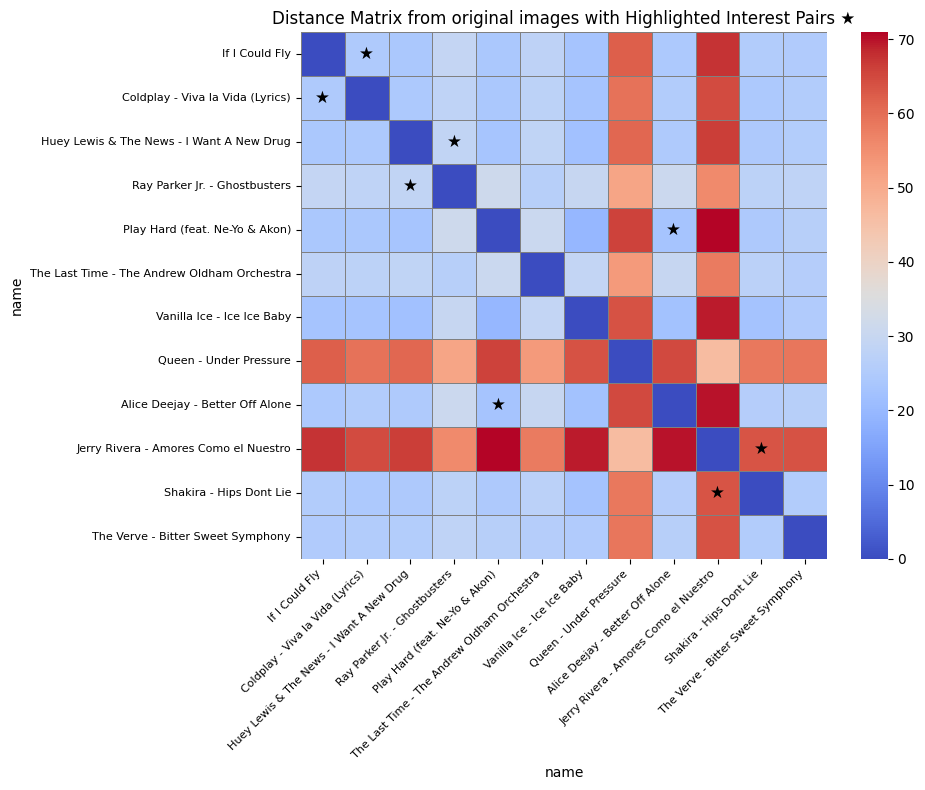

In [ ]:
def getDistanceMatrix(X1, X2):
    X1 = X1.copy().reshape(X1.shape[0], -1)
    X2 = X2.copy().reshape(X2.shape[0], -1)
    return np.sqrt(np.sum((X1[:, np.newaxis, :] - X2[np.newaxis, :, :]) ** 2, axis=-1))

distance_matrix = getDistanceMatrix(X_new_samples, X_new_samples)
distances_df_full = pd.DataFrame(distance_matrix, columns=df['name'], index=df['name'])
names = distances_df_full.columns
annot = [["" for _ in range(len(names))] for _ in range(len(names))]

for i, name1 in enumerate(names):
    for j, name2 in enumerate(names):
        if (name1, name2) in interest_pairs or (name2, name1) in interest_pairs:
            annot[i][j] = "★"

# Graficar
plt.figure(figsize=(10, 8))
sns.heatmap(distances_df_full, cmap='coolwarm', square=True, cbar=True, xticklabels=True, yticklabels=True,
            annot=annot, fmt='s', linewidths=0.5, linecolor='gray', annot_kws={"fontsize": 12, "color": "black"})

plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(fontsize=8)
plt.title("Distance Matrix from original images with Highlighted Interest Pairs ★")
plt.tight_layout()
plt.show()

In this first representation, we can't see tha pattern related to the similar songs

### Similarity from base autoencoder

Now we will use our autoencoder to get the latent representation of the songs and we will try to compare them. We will use the latent representation from the original autoencoder and the encoder tunned for music classification

In [ ]:
vae = keras.models.load_model(os.path.join(proj_dir, 'best_rec_vae.keras'))
encoder_base = vae.encoder
encoder_base.summary()

VAE Loss = 1.0 * reconstruction_loss + 10.0 * kl_loss


Model: "vae_encoder_resnet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rgb_adapter         │ (None, 224, 224,  │          9 │ input_layer_7[0]… │
│ (Functional)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ rgb_adapter[0][0] │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[2][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 1024)      │  2,098,176 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 512)       │    524,800 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_log_var (Dense)   │ (None, 512)       │    524,800 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sampling_2          │ (None, 512)       │          0 │ z_mean[0][0],     │
│ (Sampling)          │                   │            │ z_log_var[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 26,735,497 (101.99 MB)

 Trainable params: 3,147,785 (12.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
X_embeddings = encoder_base.predict(X_new_samples)[2]
distance_matrix = getDistanceMatrix(X_embeddings, X_embeddings)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


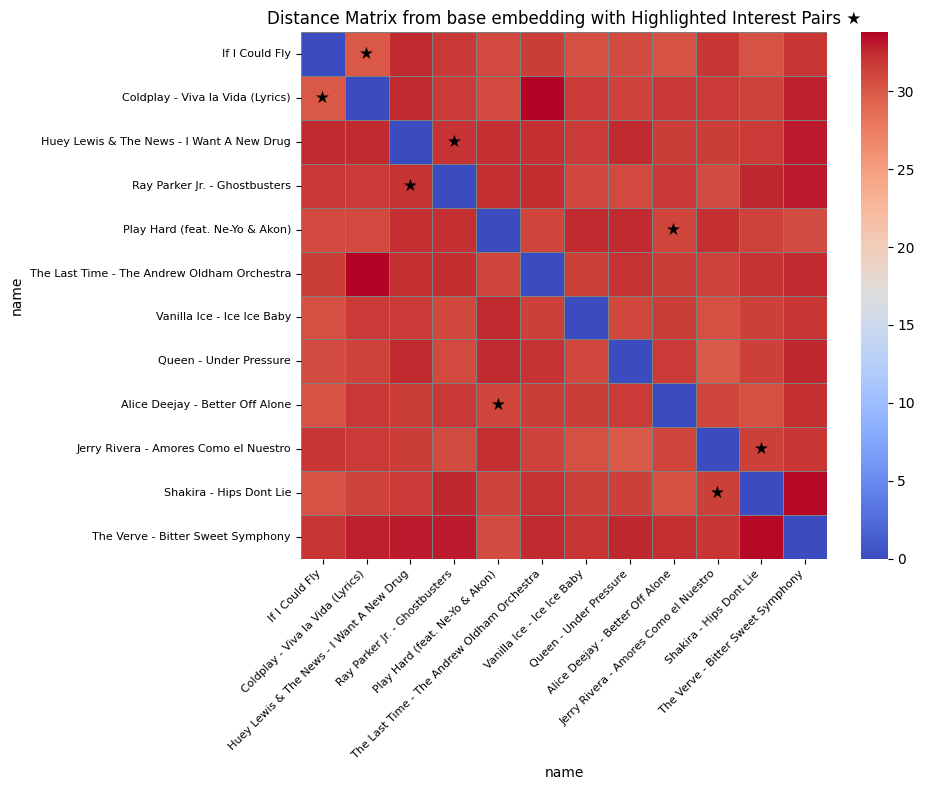

In [ ]:
distances_df_full = pd.DataFrame(distance_matrix, columns=df['name'], index=df['name'])
names = distances_df_full.columns
annot = [["" for _ in range(len(names))] for _ in range(len(names))]

for i, name1 in enumerate(names):
    for j, name2 in enumerate(names):
        if (name1, name2) in interest_pairs or (name2, name1) in interest_pairs:
            annot[i][j] = "★"

# Graficar
plt.figure(figsize=(10, 8))
sns.heatmap(distances_df_full, cmap='coolwarm', square=True, cbar=True, xticklabels=True, yticklabels=True,
            annot=annot, fmt='s', linewidths=0.5, linecolor='gray', annot_kws={"fontsize": 12, "color": "black"})

plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(fontsize=8)
plt.title("Distance Matrix from base embedding with Highlighted Interest Pairs ★")
plt.tight_layout()
plt.show()

### Similarity from classification-oriented encoder

In [ ]:
classifier = keras.models.load_model(os.path.join(proj_dir, 'final_genre_classifier.keras'))
encoder_classifier = classifier.get_layer("vae_encoder_resnet")
encoder_classifier.summary()

Model: "vae_encoder_resnet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_43      │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rgb_adapter         │ (None, 224, 224,  │          9 │ input_layer_43[0… │
│ (Functional)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ rgb_adapter[0][0] │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_36 (Dense)    │ (None, 1024)      │  2,098,176 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 512)       │    524,800 │ dense_36[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_log_var (Dense)   │ (None, 512)       │    524,800 │ dense_36[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sampling_11         │ (None, 512)       │          0 │ z_mean[0][0],     │
│ (Sampling)          │                   │            │ z_log_var[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 26,735,497 (101.99 MB)

 Trainable params: 26,682,377 (101.79 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
X_embeddings = encoder_classifier.predict(X_new_samples)[2]
distance_matrix = getDistanceMatrix(X_embeddings, X_embeddings)
distance_matrix /= distance_matrix.max(axis=1, keepdims=True)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


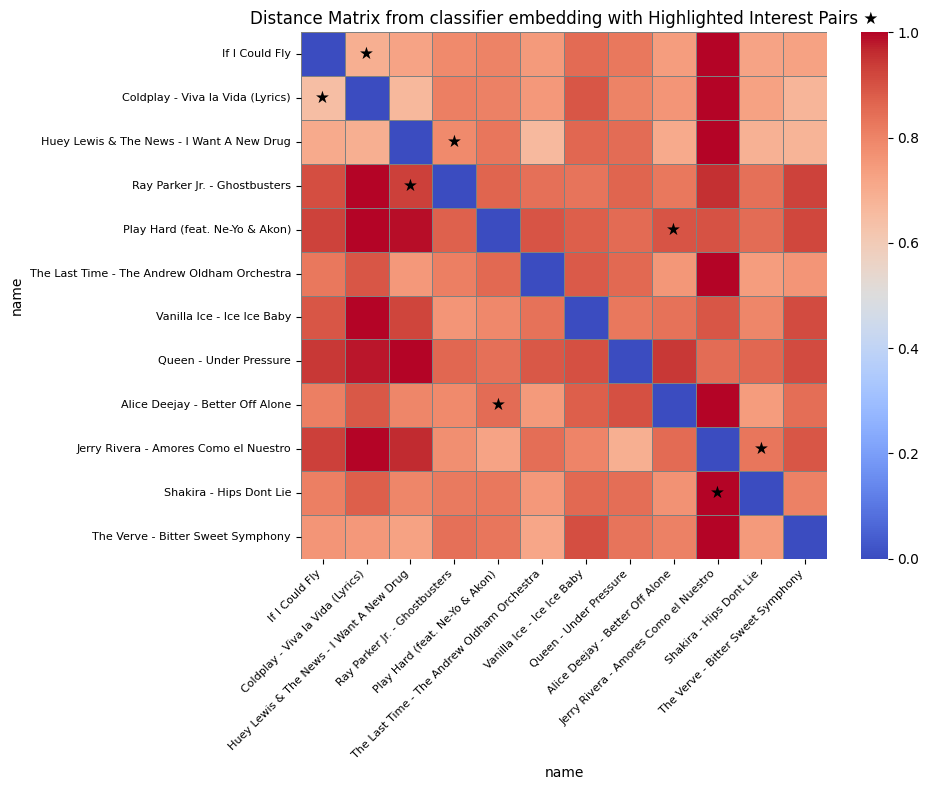

In [ ]:
distances_df_full = pd.DataFrame(distance_matrix, columns=df['name'], index=df['name'])
names = distances_df_full.columns
annot = [["" for _ in range(len(names))] for _ in range(len(names))]

for i, name1 in enumerate(names):
    for j, name2 in enumerate(names):
        if (name1, name2) in interest_pairs or (name2, name1) in interest_pairs:
            annot[i][j] = "★"

# Graficar
plt.figure(figsize=(10, 8))
sns.heatmap(distances_df_full, cmap='coolwarm', square=True, cbar=True, xticklabels=True, yticklabels=True,
            annot=annot, fmt='s', linewidths=0.5, linecolor='gray', annot_kws={"fontsize": 12, "color": "black"})

plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(fontsize=8)
plt.title("Distance Matrix from classifier embedding with Highlighted Interest Pairs ★")
plt.tight_layout()
plt.show()

In this final scenario, we have a better view of the similar images, then it seems that genre relationships had an important impact in embedding.